# **Laboratorio de Computación Cuántica**


### **Integrantes:**
- Jesús del Peso Quiroga
- Giselle Rocio González





# Práctica 3: Algoritmos cuánticos básicos. Algoritmos basados en QFT y QPE

Se presentan algoritmos cuánticos que muestran las ventajas de un sistema
de computación cuántico con respecto a uno clásico. La transformada
cuántica de Fourier (QFT) es la implementación cuántica de la transformada
discreta de Fourier sobre las amplitudes de una función de onda. Forma parte
de muchos algoritmos cuánticos, entre los que destacan el algoritmo de
factorización de Shor y la estimación cuántica de fase.

[Inserte aca la tabla de contenidos]



# Ejercicio 1. Definición de QFT

La transformada de Fourier cuántica es un operador unitario que actúa sobre
un estado cuántico

$$|\Psi\rangle = \sum_{j=0}^{N-1} |\psi_j\rangle$$

y lo mapea a otro estado cuántico

$$|\tilde{\Psi}\rangle = \sum_{j=0}^{N-1} |\tilde{\psi}_j\rangle$$
de acuerdo con la fórmula

$$|\tilde{\psi}_k\rangle = \frac{1}{\sqrt{N}} \sum_{j=0}^{N-1} \omega^{ jk } |\psi_j\rangle$$
donde $\omega = e^{2 \pi i / N}$

Es decir, la transformación de un estado genérico $|y\rangle$ sería:

$$|\Psi\rangle \to |\tilde{\Psi}\rangle = \frac{1}{\sqrt{N}} \sum_{y=0}^{N-1} \tilde{\psi_y} |y\rangle = \frac{1}{\sqrt{N}} \sum_{y=0}^{N-1} \left( \sum_{j=0}^{N-1} \psi_j \omega^{jy} \right) |y\rangle$$

Independientemente de la “etiqueta” que haya dentro del ket, estaremos
tratando con elementos base computacional cuando el elemento no lleve
tilde, es decir
$$|x\rangle, |y\rangle, \ldots$$

Estaremos tratando con la transformada de Fourier de ese elemento de la
base (es decir, el correspondiente elemento en la base de Fourier) cuando les
pongamos una tilde:
$$|\tilde{x}\rangle, |\tilde{y}\rangle, \ldots$$

## Ejercicio 1.1

$$QFT |x\rangle = |\tilde{x}\rangle = \frac{1}{\sqrt{N}} \sum_{y=0}^{N-1} \omega^{xy} |y\rangle $$

donde $\omega = e^{2 \pi i / N}$

Comprueba el resultado de aplicar la QFT a los elementos de la base para un
sistema de 4 qubits (n=4, N=16). Utilice una visualización similar a la
siguiente:

![image_1_1.png](images/image_1_1.png)


a) Para n= 4, represente todos los estados de la base computacional y su
equivalente trasformado por la QFT.


**Solución:**

In [ ]:
# Creamos el circuito correspondiente a la QFT de 4 qubits, utilizando Qiskit.
from qiskit import QuantumCircuit
from qiskit.visualization import plot_circuit_layout
import math

def create_qft_circuit_4qubits():
    """
    Crea un circuito cuántico que implementa la Transformada de Fourier Cuántica (QFT) para 4 qubits.
    """
    qc = QuantumCircuit(4)
    qc.h(3)
    qc.cp(math.pi/2, 3, 2)

    qc.h(2)
    qc.cp(math.pi/4, 3, 1)
    qc.cp(math.pi/2, 2, 1)

    qc.h(1)
    qc.cp(math.pi/8, 3, 0)
    qc.cp(math.pi/4, 2, 0)
    qc.cp(math.pi/2, 1, 0)

    qc.h(0)

    qc.swap(0, 3)
    qc.swap(1, 2)

    return qc


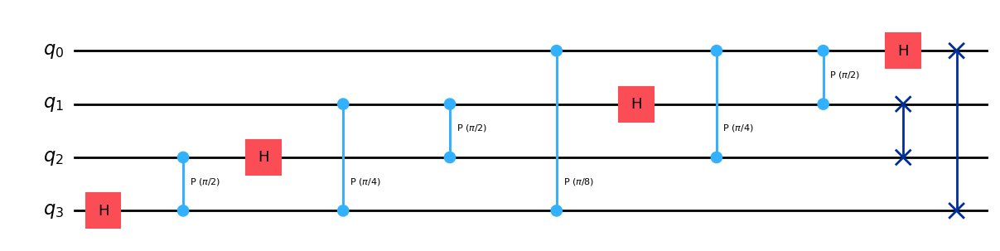

In [ ]:
qc_qft_4qubits = create_qft_circuit_4qubits()
qc_qft_4qubits.draw('mpl')

Aplicamos el circuito a los 16 estados de la base computacional para n=4 qubits:

<IPython.core.display.Latex object>

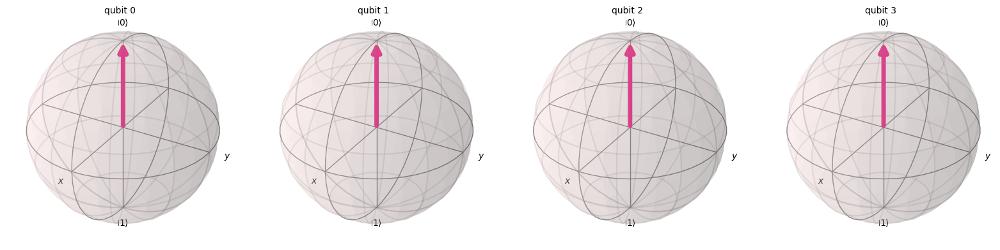

<IPython.core.display.Latex object>

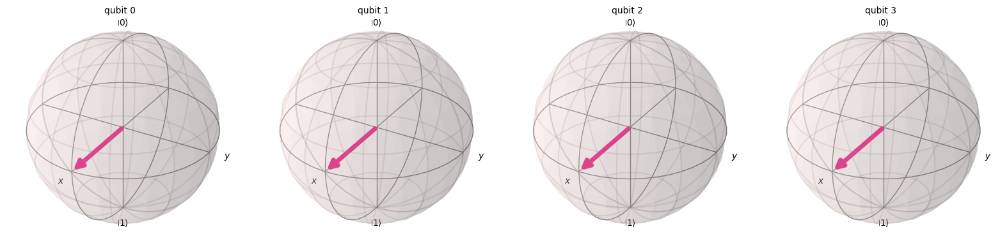


-------------------------



<IPython.core.display.Latex object>

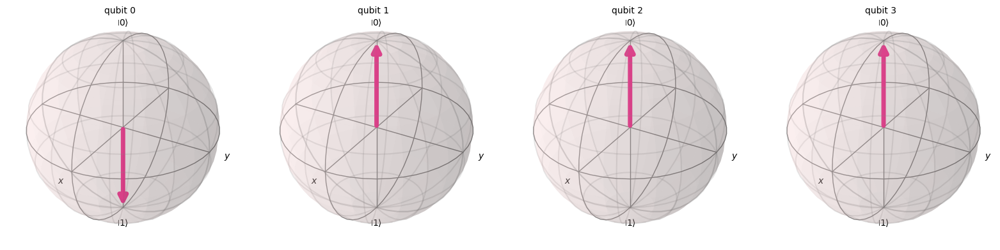

<IPython.core.display.Latex object>

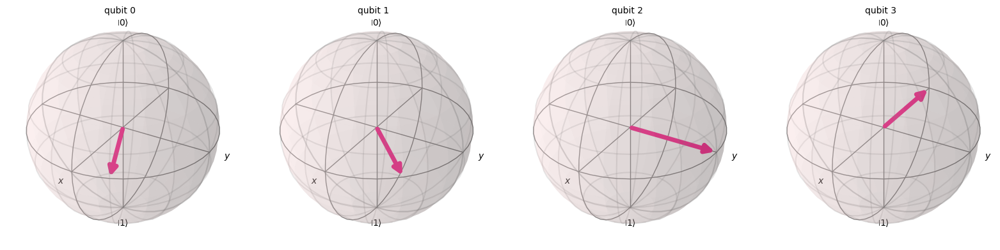


-------------------------



<IPython.core.display.Latex object>

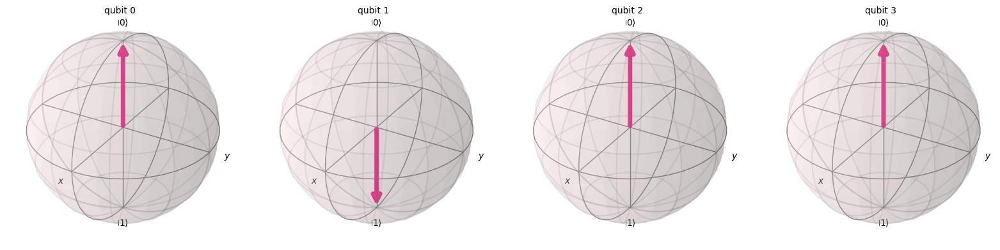

<IPython.core.display.Latex object>

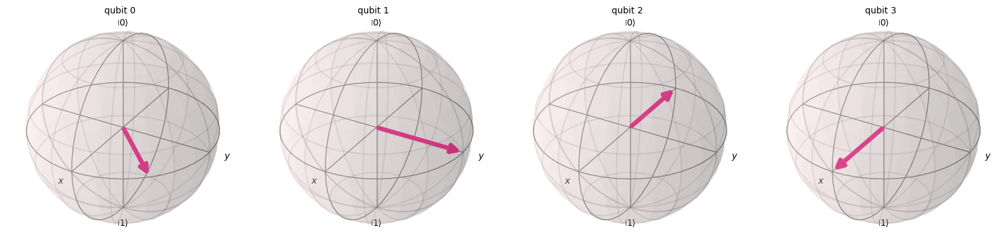


-------------------------



<IPython.core.display.Latex object>

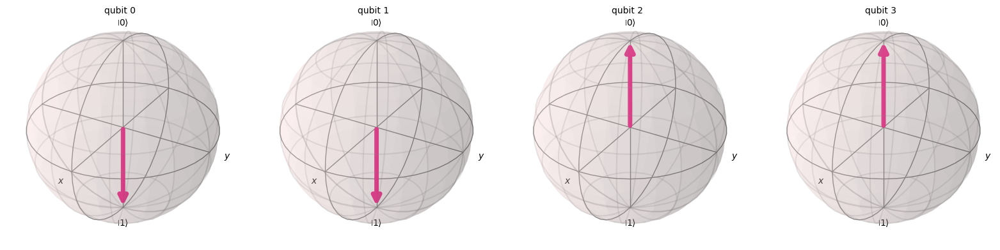

<IPython.core.display.Latex object>

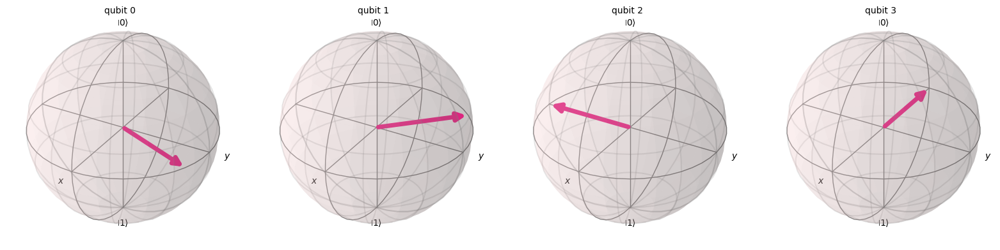


-------------------------



<IPython.core.display.Latex object>

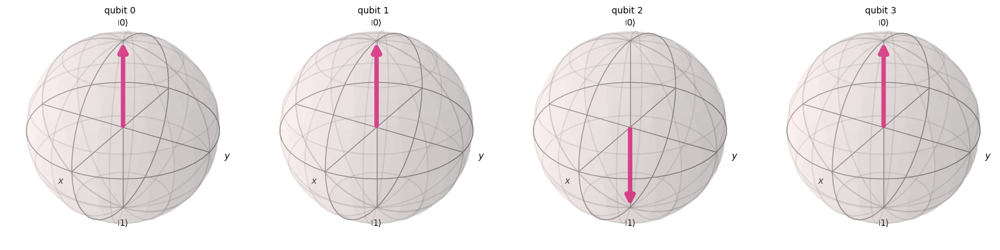

<IPython.core.display.Latex object>

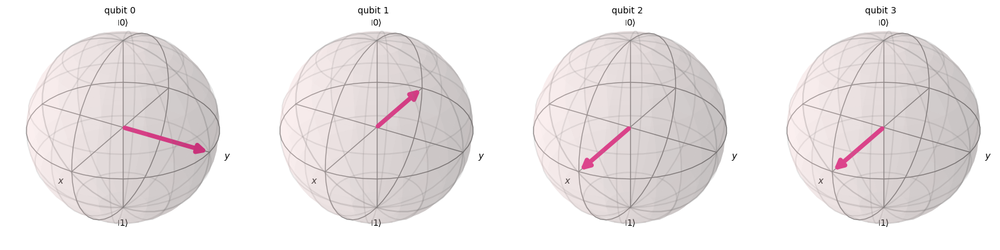


-------------------------



<IPython.core.display.Latex object>

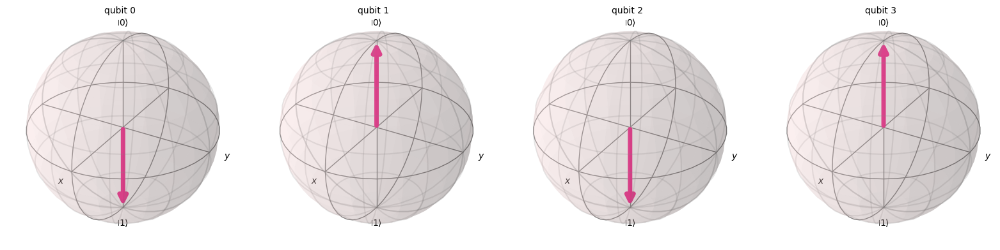

<IPython.core.display.Latex object>

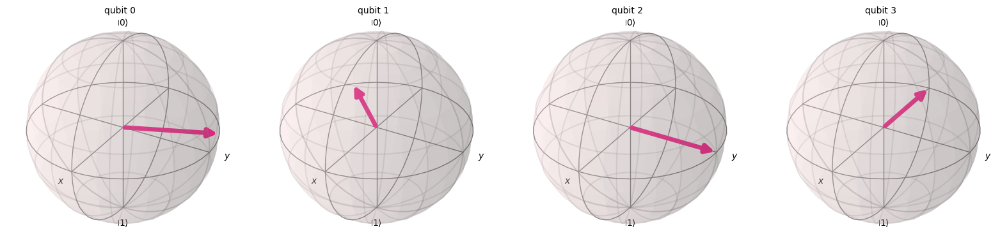


-------------------------



<IPython.core.display.Latex object>

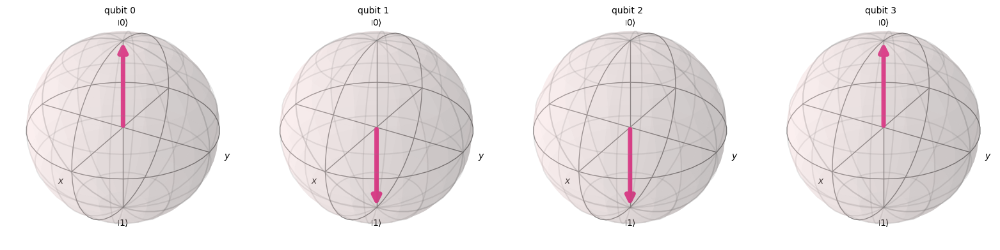

<IPython.core.display.Latex object>

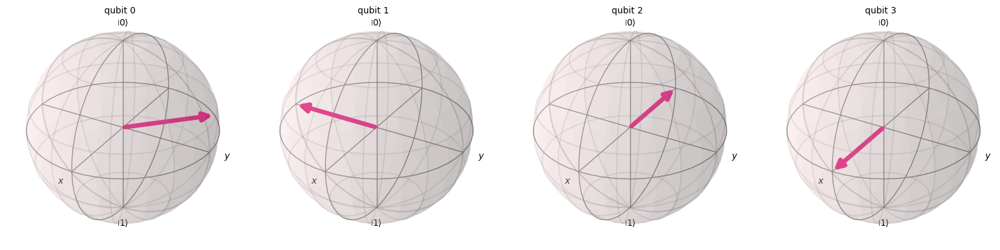


-------------------------



<IPython.core.display.Latex object>

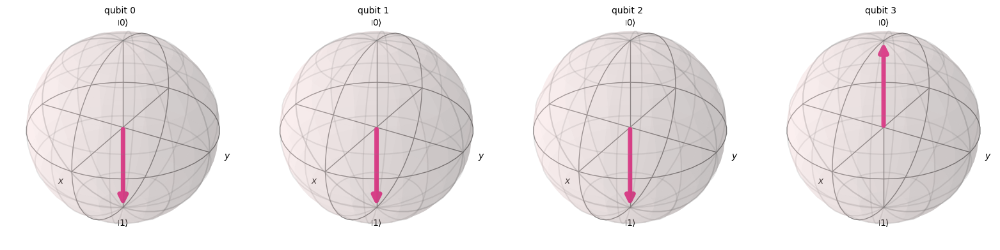

<IPython.core.display.Latex object>

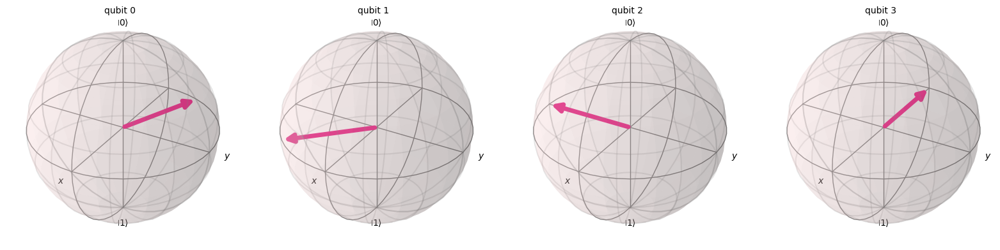


-------------------------



<IPython.core.display.Latex object>

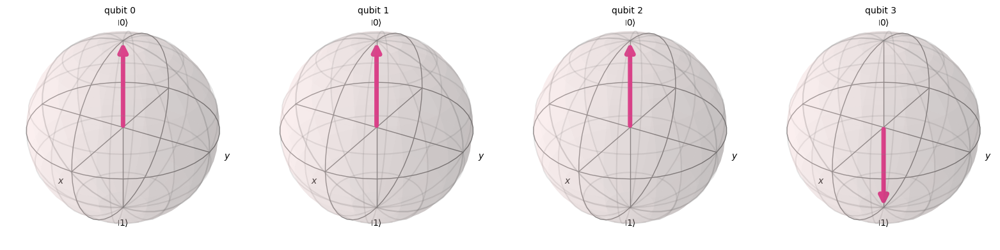

<IPython.core.display.Latex object>

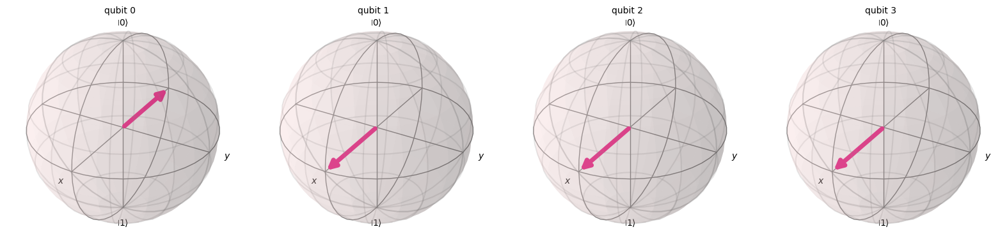


-------------------------



<IPython.core.display.Latex object>

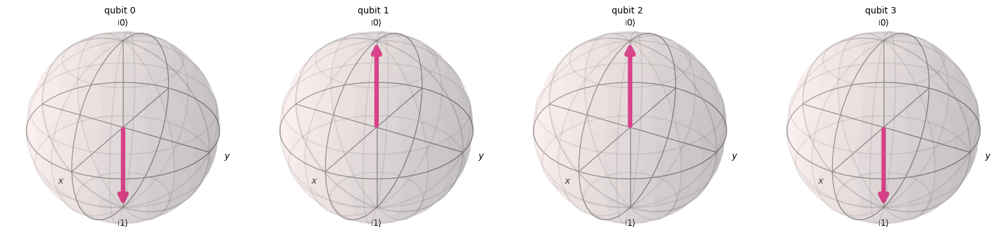

<IPython.core.display.Latex object>

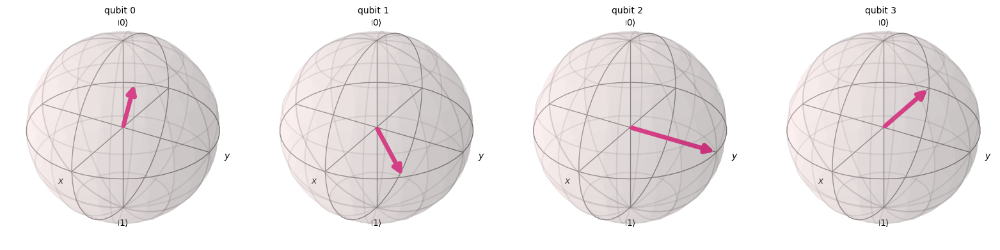


-------------------------



<IPython.core.display.Latex object>

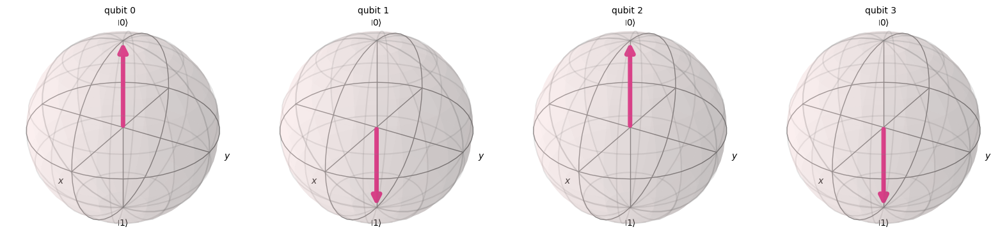

<IPython.core.display.Latex object>

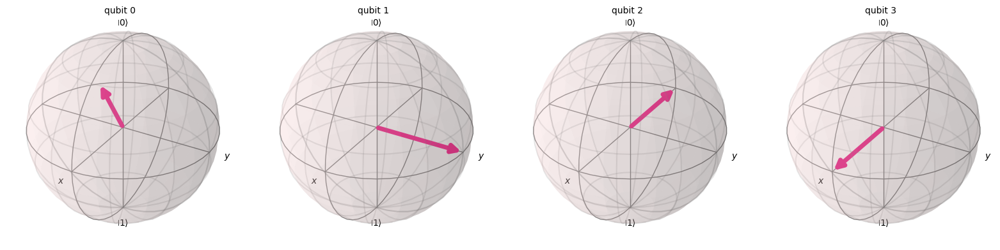


-------------------------



<IPython.core.display.Latex object>

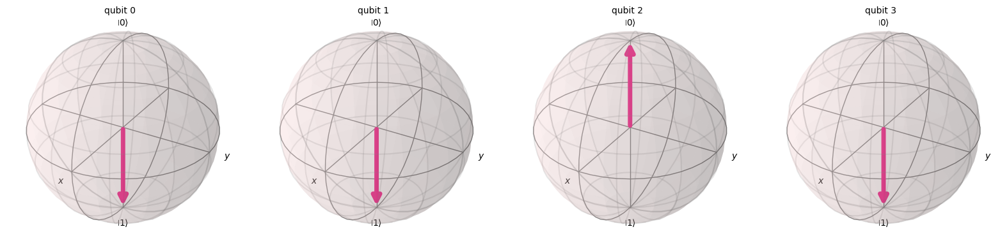

<IPython.core.display.Latex object>

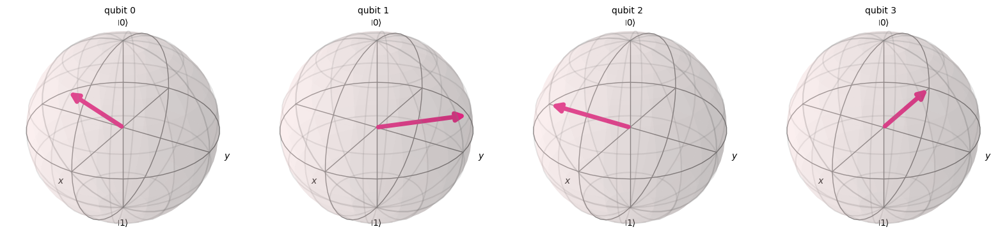


-------------------------



<IPython.core.display.Latex object>

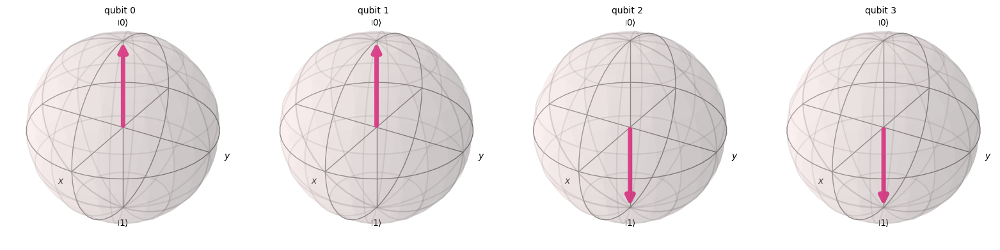

<IPython.core.display.Latex object>

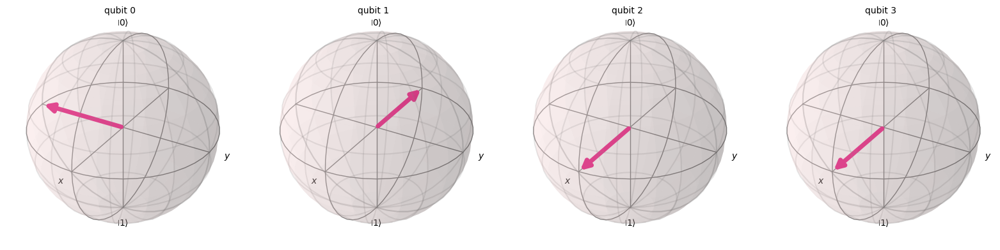


-------------------------



<IPython.core.display.Latex object>

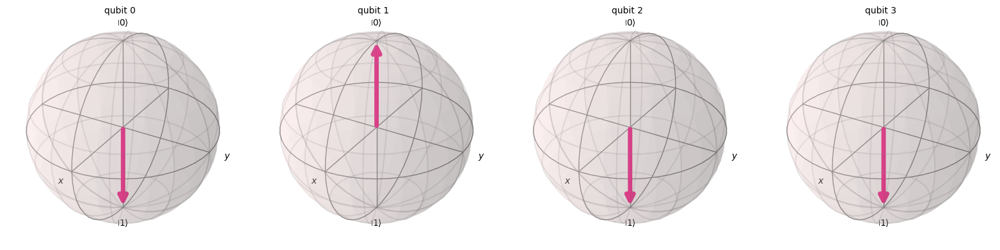

<IPython.core.display.Latex object>

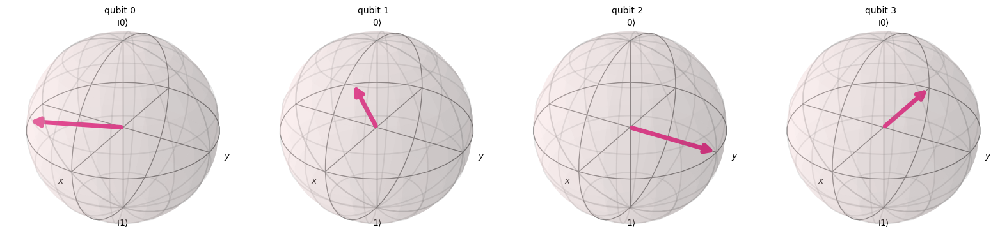


-------------------------



<IPython.core.display.Latex object>

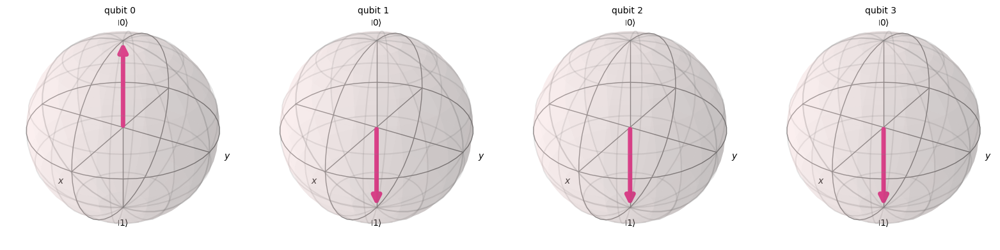

<IPython.core.display.Latex object>

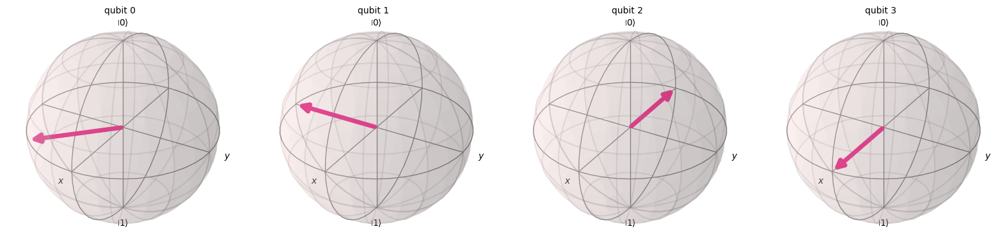


-------------------------



<IPython.core.display.Latex object>

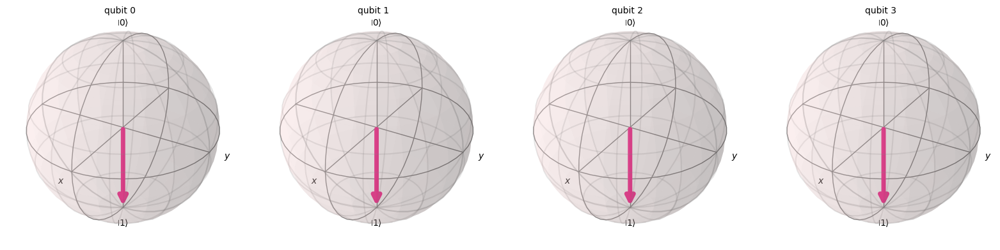

<IPython.core.display.Latex object>

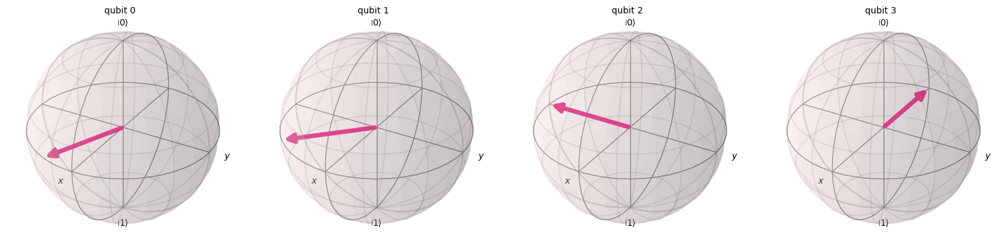


-------------------------



In [ ]:
from qiskit.quantum_info import Statevector
from qiskit.visualization import plot_bloch_multivector

for i in range(16):
    state = Statevector.from_int(i, 16)
    res_state = state.evolve(qc_qft_4qubits)
    display(state.draw('latex'))
    display(plot_bloch_multivector(state))
    display(res_state.draw('latex', prefix=f"QFT {state.draw('latex').data[2:-2]} = "))
    display(plot_bloch_multivector(res_state))
    print('\n-------------------------\n')



b) En los estados trasformados se codifica la información como ángulos de
giro.

- i. ¿Qué qubit tiene mayor precisión?

El qubit con mayor precisión es el qubit 0, ya que es el que tiene el menor ángulo de rotación, es decir, el que puede representar la mayor cantidad de estados diferentes.

En la QFT, los qubits se ordenan de forma que las fases más finas se asignan al qubit más significativo.  
Después de la inversión final de orden de la QFT, el qubit que queda en primera posición (qubit 0) es el que captura la fracción más exacta de la fase, y por tanto el de mayor precisión.

- ii. ¿Cuál es el menor ángulo?

La QFT introduce fases discretizadas con saltos mínimos de tamaño:

$$
\Delta \varphi = \frac{2\pi}{N}
$$

Para el caso de este ejercicio se cumple:

$$
N = 2^4 = 16
$$

Por lo que el ángulo mínimo entre valores consecutivos de fase es:

$$
\Delta \varphi = \frac{2\pi}{16}
$$

Por tanto, el menor ángulo de rotación es $\frac{\pi}{8}$. En general, para un sistema de n qubits, el menor ángulo de rotación es $\frac{\pi}{2^{n-1}}$.

- iii. ¿Cuántos giros completos realizan cada uno de los qubits?

El número de rotaciones de cada qubit depende del estado de entrada al circuito en la base computacional y del qubit del que se trate. Según la fórmula
$$QFT |j\rangle = \frac{1}{\sqrt{N}} \sum_{k=0}^{N-1} \omega^{ jk } |k\rangle  = \frac{1}{\sqrt{N}} \sum_{k=0}^{N-1} e^{2 \pi i \frac{jk}{N}} |k\rangle$$

se obtiene que el qubit $k$ realiza $\frac{2\pi}{N}jk\frac{1}{2\pi} = \frac{jk}{N} = \frac{jk}{2^n}$ giros.

Els siguiente código construye una tabla que muestra el número de rotaciones que realiza cada qubit para cada estado de la base computacional:

In [ ]:
#!pip install tabulate

import pandas as pd

def get_qft_num_rotations(j, k, n):
    """
    Calcula el número de rotaciones necesarias para el qubit j en un circuito QFT de n qubits.

    Args:
        j (int): Índice del estado de entrada.
        k (int): índice del qubit.
        n (int): Número total de qubits.
    """
    return j*k/2**n


def get_qft_rotation_table(n):
    """
    Genera una tabla con el número de rotaciones necesarias para cada qubit en un circuito QFT de n qubits.
    """
    data = []
    j_list = list(range(2**n))
    k_list = [2**i for i in range(n)]
    for j in j_list:
        for k in k_list:
            d = {"j": j, "qubit": int(math.log2(k)), "num_rotations": get_qft_num_rotations(j, k, n)}
            data.append(d)
    return pd.DataFrame(data)


# Genera la tabla de rotaciones para 4 qubits y la muestra en markdown
df = get_qft_rotation_table(4)
df_pivot = df.pivot(index='j', columns='qubit', values='num_rotations')
df_pivot.columns = [f'qubit {col}' for col in df_pivot.columns]
df_pivot.reset_index(inplace=True)
df_pivot.style.set_caption("Número de rotaciones necesarias para cada qubit en un circuito QFT de 4 qubits")

print("Número de rotaciones experimentadas por cada qubit en un circuito QFT de 4 qubits (j: estado de entrada:")
display(df_pivot)



Número de rotaciones experimentadas por cada qubit en un circuito QFT de 4 qubits (j: estado de entrada:


,j,qubit 0,qubit 1,qubit 2,qubit 3
0,0,0.0000,0.000,0.00,0.0
1,1,0.0625,0.125,0.25,0.5
2,2,0.1250,0.250,0.50,1.0
3,3,0.1875,0.375,0.75,1.5
4,4,0.2500,0.500,1.00,2.0
5,5,0.3125,0.625,1.25,2.5
6,6,0.3750,0.750,1.50,3.0
7,7,0.4375,0.875,1.75,3.5
8,8,0.5000,1.000,2.00,4.0
9,9,0.5625,1.125,2.25,4.5


In [ ]:
# Imprime la tabla en formato markdown
from tabulate import tabulate
s_latex = (tabulate(df_pivot, headers='keys', tablefmt='github', showindex=False))

print("Número de rotaciones experimentadas por cada qubit en un circuito QFT de 4 qubits (j: estado de entrada):")

# Display the table in markdown format
from IPython.display import Markdown, display
display(Markdown(s_latex))


Número de rotaciones experimentadas por cada qubit en un circuito QFT de 4 qubits (j: estado de entrada):


|   j |   qubit 0 |   qubit 1 |   qubit 2 |   qubit 3 |
|-----|-----------|-----------|-----------|-----------|
|   0 |    0      |     0     |      0    |       0   |
|   1 |    0.0625 |     0.125 |      0.25 |       0.5 |
|   2 |    0.125  |     0.25  |      0.5  |       1   |
|   3 |    0.1875 |     0.375 |      0.75 |       1.5 |
|   4 |    0.25   |     0.5   |      1    |       2   |
|   5 |    0.3125 |     0.625 |      1.25 |       2.5 |
|   6 |    0.375  |     0.75  |      1.5  |       3   |
|   7 |    0.4375 |     0.875 |      1.75 |       3.5 |
|   8 |    0.5    |     1     |      2    |       4   |
|   9 |    0.5625 |     1.125 |      2.25 |       4.5 |
|  10 |    0.625  |     1.25  |      2.5  |       5   |
|  11 |    0.6875 |     1.375 |      2.75 |       5.5 |
|  12 |    0.75   |     1.5   |      3    |       6   |
|  13 |    0.8125 |     1.625 |      3.25 |       6.5 |
|  14 |    0.875  |     1.75  |      3.5  |       7   |
|  15 |    0.9375 |     1.875 |      3.75 |       7.5 |

## Ejercicio 1.2
Programe en Qiskit de manera genérica la creación de un circuito que realice la QFT en función del número de qubits.

![image_1_2.png](images/image_1_2.png)

a) Compruebe su funcionamiento para n=2, 3 y 4.


**Solución:**

En primer lugar, escribimos una función para crear circuitos para calcular la QFT, para distintos números de qubits.

A continuación mostramos los circuitos generados para 1, 3 y 4 qubits.

Finalmente, comprobamos la corrección de los resultados obtenidos por cada uno de estos circuitos, comparándolos con la implementación de Qiskit.

In [ ]:
# Creamos una función genérica para la QFT en función del número de qubits.
from qiskit import QuantumCircuit

def create_qft_circuit(n):
    """
    Crea un circuito cuántico que implementa la Transformada de Fourier Cuántica (QFT) para n qubits.
    """
    qc = QuantumCircuit(n)

    for j in range(n-1, -1, -1):
        for k in range(n-1, j, -1):
            qc.cp(math.pi / (2 ** (k - j)), k, j)
        qc.h(j)
#        qc.barrier()

    for i in range(n // 2):
        qc.swap(i, n - i - 1)

    return qc

Mostramos los circuitos genrados. Puede comprobarse que se corresponden con los esperados.

Circuito QFT de 2 qubits:


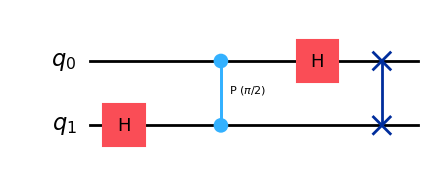

In [ ]:
print("Circuito QFT de 2 qubits:")

create_qft_circuit(2).draw('mpl')

Vemos que el circuito generado para 2 qubits realiza el giro de fase esperado de $\frac{2 \pi}{4} = \frac{\pi}{2}$ en el qubit 0 controlado por el qubit 1, del modo en el que se ha explicado en el ejercicio anterior.

Circuito QFT de 3 qubits:


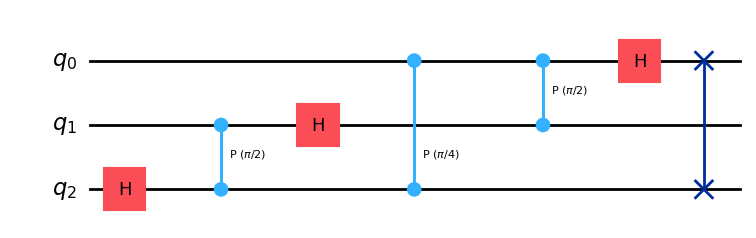

In [ ]:
print("Circuito QFT de 3 qubits:")

create_qft_circuit(3).draw('mpl')

En este caso vemos que el circuito generado para 3 qubits realiza los giros de fase esperados de $\frac{2 \pi}{8} = \frac{\pi}{4}$ en el qubit 0 controlado por el qubit 2, y de $\frac{2 \pi}{4} = \frac{\pi}{2}$ en el qubit 0 controlado por el qubit 1, y de $\frac{2 \pi}{4} = \frac{\pi}{2}$ en el qubit 1 controlado por el qubit 2, del modo en el que se ha explicado en el ejercicio anterior.

Circuito QFT de 4 qubits:


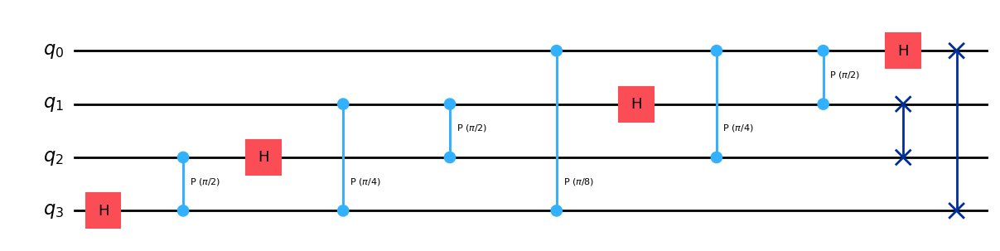

In [ ]:
print("Circuito QFT de 4 qubits:")

create_qft_circuit(4).draw('mpl')

De forma análoga, el circuito generado para 4 qubits realiza los giros de fase esperados de $\frac{2 \pi}{16} = \frac{\pi}{8}$ en el qubit 0 controlado por el qubit 3, de $\frac{2 \pi}{8} = \frac{\pi}{4}$ en el qubit 0 controlado por el qubit 2, de $\frac{2 \pi}{4} = \frac{\pi}{2}$ en el qubit 0 controlado por el qubit 1, de $\frac{2 \pi}{8} = \frac{\pi}{4}$ en el qubit 1 controlado por el qubit 3, de $\frac{2 \pi}{4} = \frac{\pi}{2}$ en el qubit 1 controlado por el qubit 2, y de $\frac{2 \pi}{4} = \frac{\pi}{2}$ en el qubit 2 controlado por el qubit 3, del modo en el que se ha explicado en el ejercicio anterior.

In [ ]:
# Ahora comparamos los resultados de los circuitos para cada uno de los vectores de estado de la base computacional.

from qiskit.circuit.library import QFT
from qiskit.quantum_info import Statevector


num_qubits_list = [2, 3, 4]

for n in num_qubits_list:
    input_states = [Statevector.from_int(i, 2**n) for i in range(2**n)]
    qft_circuit = create_qft_circuit(n)
    qft_circuit_qiskit = QFT(num_qubits=n, do_swaps=True)
    print(f"Comparación de resultados para QFT de {n} qubits:")
    for state in input_states:
        result_custom = state.evolve(qft_circuit)
        result_qiskit = state.evolve(qft_circuit_qiskit)
        display(state.draw('latex', prefix="\\text{Estado de entrada: }"))
        display(result_custom.draw('latex', prefix="\\text{Resultado QFT para nuestro circuito: }"))
        display(result_qiskit.draw('latex', prefix="\\text{Resultado QFT para circuito Qiskit: }"))

Comparación de resultados para QFT de 2 qubits:


/tmp/ipykernel_371471/3363784164.py:12: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qft_circuit_qiskit = QFT(num_qubits=n, do_swaps=True)


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Comparación de resultados para QFT de 3 qubits:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Comparación de resultados para QFT de 4 qubits:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Podemos comprobar qeu los resultados coinciden con los obtenidos con la implementación de Qiskit.

b) Compruebe su funcionamiento para $n$ grande, para ello compare los
resultados de la QFT que ha implementado con los resultados que se
obtienen con la función de librería dispinibel en Qiskit.

**Solución:**

Escribimos código que compara las matrices correspondientes a los operadores de las dos implementaciones de la QFT, para distintos números de qubits. Comparamos ambas matrices.

In [ ]:
# Comparamos el funcionamiento de nuestra QFT con la función de librería disponible en Qiskit.
from qiskit.circuit.library import QFT
from qiskit.quantum_info import Operator
import numpy as np

n = 10
qc_qft_lib = QFT(num_qubits=n, do_swaps=True)
qc_qft_custom = create_qft_circuit(n)

# Comparamos las matrices unitarias de ambos circuitos
unitary_lib = Operator.from_circuit(qc_qft_lib)
unitary_custom = Operator.from_circuit(qc_qft_custom)
are_equal = np.allclose(unitary_lib, unitary_custom)
print(f"\n\n¿Las matrices unitarias de la QFT de librería y la personalizada son iguales?: {are_equal}")

# Mostramos la matriz unitaria de la QFT para este ejemplo:
print("Matriz unitaria de la QFT con nuestra implementación:")
display(unitary_custom.draw("latex"))

print("Matriz unitaria de la QFT con la implementación de Qiskit:")
display(unitary_lib.draw("latex"))


/tmp/ipykernel_371471/116118346.py:7: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qc_qft_lib = QFT(num_qubits=n, do_swaps=True)




¿Las matrices unitarias de la QFT de librería y la personalizada son iguales?: True
Matriz unitaria de la QFT con nuestra implementación:


<IPython.core.display.Latex object>

Matriz unitaria de la QFT con la implementación de Qiskit:


<IPython.core.display.Latex object>

Finalmente, como ejemplo, mostramos, sobre la esfera de Bloch, la acción de ambos circuitos sobre un estado específico:

Resultado QFT librería de Qiskit:


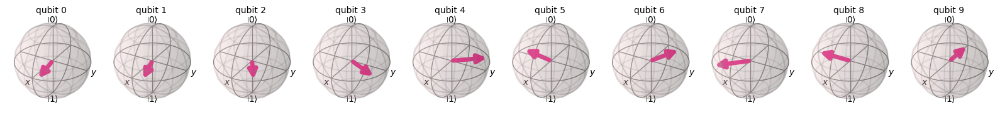

Resultado QFT personalizada:


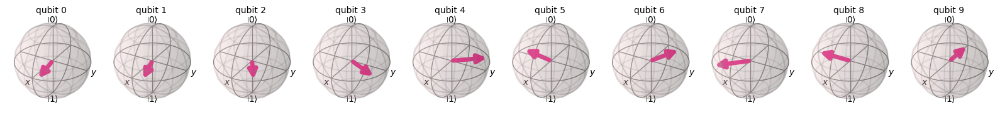

In [ ]:
# Como ejemplo, mostramos la acción de ambos circuitos sobre un estado específico

n = 10
state = Statevector.from_int(23, 2**n)

res_state_lib = state.evolve(qc_qft_lib)
res_state_custom = state.evolve(qc_qft_custom)

print("Resultado QFT librería de Qiskit:")
display(plot_bloch_multivector(res_state_lib))

print("Resultado QFT personalizada:")
display(plot_bloch_multivector(res_state_custom))


La transformada cuántica de Fourier (QFT) transforma entre dos bases, la
base computacional ($Z$) y la base de Fourier. La puerta H es la transformada
de Fourier para un solo qubit, y esta transforma entre la base ( $|0\rangle$ y $|1\rangle$) en
la base X ( $|+\rangle$ y $|-\rangle$). Del mismo modo, todos los estados multi-qubit en la
base computacional tienen estados correspondientes en la base de Fourier.
La QFT es simplemente la función que transforma entre estas bases.

$$|\text{Estado en la base computacional}\rangle \xrightarrow{\text{QFT}} |\text{Estado en la base de Fourier}\rangle$$

$$QFT |x\rangle = |\tilde{x}\rangle$$

$$|\tilde{0}\rangle = |+\rangle = H|0\rangle = QFT|0\rangle$$
$$|\tilde{1}\rangle = |-\rangle = H|1\rangle = QFT|1\rangle$$

Se denotan los estados en la base de Fourier usando la tilde.

# Ejercicio 2. Multiplicación con QFT

El circuito de multiplicación que utilizaremos se conoce como circuito
multiplicador QFT. Fue desarrollado por Lidia Ruiz-Pérez y Juan García-Escartín, quienes lo publicaron en su artículo "Aritmética cuántica con la transformada cuántica de Fourier", disponible aquí:
[https://arxiv.org/pdf/1411.5949.pdf](https://arxiv.org/pdf/1411.5949.pdf)

![image_2_1.png](images/image_2_1.png)



## Ejercicio 2.1

Programe en Qiskit un circuito que realice la multiplicación 2*3 = 6.

**Solución:**

El circuito propuesto en el artículo mencionado realiza la multiplicación de dos números $a$ y $b$ mediante sumas ponderadas sucesivas de $a$ controladas por los bits de $b$.

Para ello necesitamos, previamente, un circuito que realice la suma utilizando la QFT.
Después, construiremos el circuito de multiplicación utilizando dicho circuito de suma.

En primer lugar, implementamos el circuito de suma basado en la QFT:

In [ ]:
# Construimos el circuto sumador cuántico utilizando la QFT.

def create_partial_adder_circuit(n, a, b, scale=1):
    """
    Crea un circuito cuántico que implementa un sumador cuántico utilizando la QFT para n qubits.
    Este circuito no incluye la QFT inicial y final, solo la parte de adición de fase y es concebido para ser usado
    como un bloque dentro de un circuito completo.
    Por ejemplo, puede ser utilizado dentro de un circuito de multiplicación cuántica basado en sumas parciales de fases.
    Este circuito suma dos números enteros a y b de n bits cada uno.

    Este circuito, por tanto, realiza la adición de fase, mediante puertas de fase controladas por los bits de b, en el dominio de la QFT.

    Esta es una suma no modular, por lo que se añade un qubit extra para evitar desbordamiento.

    Args:
        n (int): Número de bits de los números a sumar.
        a (int): Primer número entero a sumar.
        b (int): Segundo número entero a sumar.

    Returns:
        QuantumCircuit: Circuito cuántico que implementa el sumador parcial QFT.
    """
    # Comprobamos la coherencia de los datos
    if a >= 2**n or b >= 2**n:
        raise ValueError("Los números a y b deben ser menores que 2^n.")

    # Número total de qubits (n para a, n para b).
    # Como este sumador es parcial, no añadimos qubit extra para evitar overflow.
    total_qubits = 2 * n
    qc = QuantumCircuit(total_qubits, name=f"Partial QFT Adder n={n}, a={a}, b={b}, scale={scale}")

    # 1. Realizar la adición de fase controlada por los bits de b
    for i in range(n-1, -1, -1):
        for j in range(i+1):
            qc.cp(scale*2*math.pi/2**(j+1), n-1-j-(n-i-1), 2*n-i-1)
    return qc


A continuación, construimos el circuito multiplicador utilizando el circuito sumador:

In [ ]:
def create_qft_multiplier(n, a, b):
    """
    Crea un circuito cuántico que implementa un multiplicador cuántico utilizando sumadores QFT para n qubits.
    Este circuito multiplica dos números enteros a y b de n bits cada uno.

    Args:
        n (int): Número de bits de los números a multiplicar.
        a (int): Primer número entero a multiplicar.
        b (int): Segundo número entero a multiplicar.

    Returns:
        QuantumCircuit: Circuito cuántico que implementa el multiplicador QFT.
    """
    # Comprobamos la coherencia de los datos
    if a >= 2**n or b >= 2**n:
        raise ValueError("Los números a y b deben ser menores que 2^n.")

    # Número total de qubits (n para a, n para b, 2n para el resultado)
    total_qubits = 5 * n  # n para b, 2n para a y 2n  para el resultado
    qc = QuantumCircuit(total_qubits, 2*n)

    # 1. Preparar los estados iniciales de a y b
    for i in range(n):
        if (b >> i) & 1:
            qc.x(i)  # Cargar el número b en los primeros n qubits
        if (a >> i) & 1:
            qc.x(n + i)  # Cargar el número a en los siguientes 2n qubits
        # El resto de qubits (2n) se inicializan en |0> para el resultado (ancillas)
    qc.barrier()

    # 2. Aplicar QFT al registro que contiene los qubits de ancilla del resultado
    qc.append(QFT(num_qubits=2*n, do_swaps=True).to_gate(), range(3*n, total_qubits))
    qc.barrier()

    # 3. Realizar la multiplicación mediante sumadores controlados por los bits de b
    for i in range(n):
        sum_qc = create_partial_adder_circuit(2*n, 0, 0, scale=2**i)  # Creamos un sumador parcial QFT vacío de 2n bits, escalado por 2^i
        controlled_qc = sum_qc.to_gate().control()  # Convertimos el sumador en una puerta controlada
        qc.append(controlled_qc, [i] + list(range(n, 5*n)))
        qc.barrier()

    # 3. Aplicar QFT inversa al registro que contiene el resultado
    qc.append(QFT(num_qubits=2*n, do_swaps=True, inverse=True).to_gate(), range(3*n, total_qubits))

    # 4. Medir el registro que contiene el resultado
    qc.measure(range(3*n, total_qubits), range(2*n))
    return qc


/tmp/ipykernel_371471/4145027453.py:32: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qc.append(QFT(num_qubits=2*n, do_swaps=True).to_gate(), range(3*n, total_qubits))
/tmp/ipykernel_371471/4145027453.py:43: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qc.append(QFT(num_qubits=2*n, do_swaps=True, inverse=True).to_gate(), range(3*n, total_qubits))


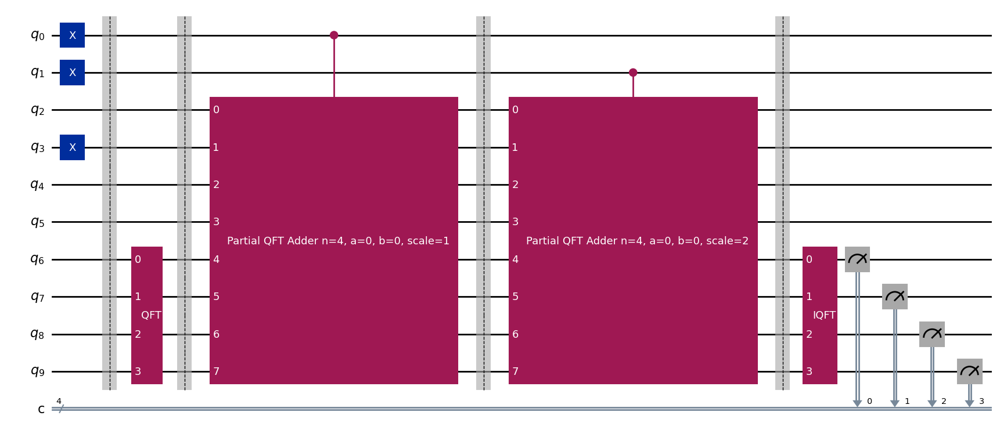

In [ ]:
# Creamos el circuito total

qc = create_qft_multiplier(2, 2, 3)
qc.draw('mpl')

Finalmente, ejecutamos el circuito para multiplicar 2 (010) * 3 (011) = 6 (0110) y mostramos los resultados:

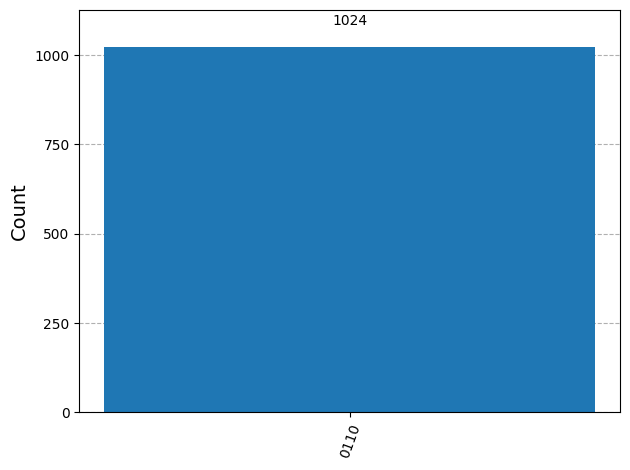

In [ ]:
from qiskit_aer import AerSimulator
from qiskit import transpile
from qiskit.visualization import plot_histogram

aer = AerSimulator()
qc_compiled = transpile(qc, aer)
result = aer.run(qc_compiled, shots=1024).result()
counts = result.get_counts()

plot_histogram(counts)


Como puede observarse, el resultado mayoritario es 0110, que corresponde al valor decimal 6, como se esperaba.

# Ejercicio 3. Evaluación de funciones aritméticas con QFT

La tarea consiste en construir circuitos cuánticos que calculen operaciones
básicas con enteros positivos.

En el enfoque de Ruiz-Pérez y García-Escartín, la idea central es que, en la base de Fourier, las operaciones aritméticas sobre enteros se reducen a aplicar fases sobre los qubits. La QFT codifica un número entero en fases distribuidas sobre los qubits; sumar y restar constantes se convierte en aplicar puertas de fase adecuadas, y a partir de ahí se construyen circuitos aritméticos.



## Ejercicio 3.1
Programe en Qiskit un circuito que realice la operación suma y sea capaz de devolver:

320 (101000000) + 150 (10010110) = 470 (0111010110)

**Solución:**

A partir del paper, seguimos el siguiente procedimiento para construir el circuito sumador basado en la QFT:

Sea un registro de $L$ qubits que codifica un entero $a$ en base computacional: $|a\rangle$. El procedimiento es:

1. Aplicar QFT al registro: $|a\rangle \to |\tilde{a}\rangle$.  
2. En la base de Fourier, sumar el valor $b$ se implementa aplicando, en cada qubit $j$, una puerta de fase
   $$
   P(\theta_j), \quad \theta_j = \frac{2\pi\, b}{2^{j+1}}.
   $$
3. Aplicar la QFT inversa para volver a la base computacional:
   $$
   |\tilde{a}\rangle \xrightarrow{+\;b} |\widetilde{a+b}\rangle \xrightarrow{\text{QFT}^\dagger} |a + b\rangle.
   $$

En este caso, añadimos un qubit extra para evitar overflow, a diferencia del circuito sumador parcial usado en el circuito multiplicador.

In [ ]:
# Construimos el circuto sumador cuántico utilizando la QFT.
# En este caso, añadimos un qubit extra para evitar overflow.

def create_qft_adder_circuit(n, a, b, scale=1):
    """
    Crea un circuito cuántico que implementa un sumador cuántico utilizando la QFT para n qubits.
    Este circuito suma dos números enteros a y b de n bits cada uno.

    La primera parte del circuito calcula la QFT del número a.
    La segunda parte realiza la adición de fase, emdiantes puertas de fase controladas por los bits de b, en el dominio de la QFT.
    La tercera parte aplica la QFT inversa para obtener el resultado de la suma en la base computacional.

    Esta es una suma no modular, por lo que se añade un qubit extra para evitar desbordamiento.

    Args:
        n (int): Número de bits de los números a sumar.
        a (int): Primer número entero a sumar.
        b (int): Segundo número entero a sumar.

    Returns:
        QuantumCircuit: Circuito cuántico que implementa el sumador QFT.
    """
    # Comprobamos la coherencia de los datos
    if a >= 2**n or b >= 2**n:
        raise ValueError("Los números a y b deben ser menores que 2^n.")

    # Número total de qubits (n para a, n para b, 1 extra para evitar overflow)
    total_qubits = 2 * n + 1
    qc = QuantumCircuit(total_qubits, n+1)

    # 1. Preparar los estados iniciales de a y b
    for i in range(n):
        if (a >> i) & 1:
            qc.x(n + i)  # Cargar el número a en los siguientes n qubits
        if (b >> i) & 1:
            qc.x(i)  # Cargar el número b en los primeros n qubits
    # 2. Aplicar QFT al registro que contiene a.
    # En este caso usamos la implementación de la QFT de Qiskit
    qc.append(QFT(num_qubits=n+1, do_swaps=True).to_gate(), range(n, total_qubits))
    # 3. Realizar la adición de fase controlada por los bits de b
    for i in range(n):
        qc.cp(2*math.pi/2**(i+2), n-1-i, n)
    qc.barrier()
    for i in range(n-1, -1, -1):
        for j in range(i+1):
            qc.cp(2*math.pi/2**(j+1), n-1-j-(n-i-1), 2*n-i)
        qc.barrier()
    # 4. Aplicar QFT inversa al registro que contiene a para obtener el resultado de la suma
    qc.append(QFT(num_qubits=n+1, do_swaps=True, inverse=True).to_gate(), range(n, total_qubits))
    # 5. Medir el registro que contiene a para obtener el resultado de la suma
    qc.measure(range(n, 2*n + 1), range(n + 1))
    return qc


/tmp/ipykernel_371471/3292416943.py:39: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qc.append(QFT(num_qubits=n+1, do_swaps=True).to_gate(), range(n, total_qubits))
/tmp/ipykernel_371471/3292416943.py:49: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qc.append(QFT(num_qubits=n+1, do_swaps=True, inverse=True).to_gate(), range(n, total_qubits))


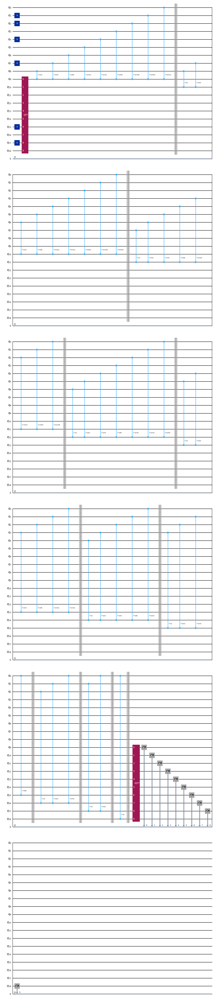

In [ ]:
# Utilizando la función creada en el ejercicio anterior, construimos un circuito sumador QFT y lo representamos gráficamente.
qc = create_qft_adder_circuit(9, 320, 150)
qc.draw('mpl')

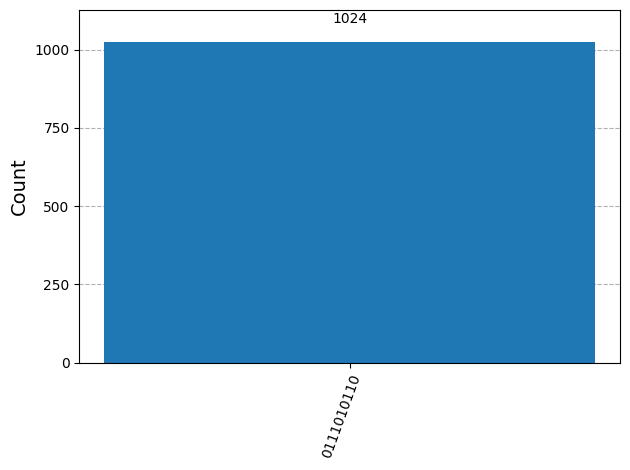

In [ ]:
from qiskit import transpile
from qiskit_aer import Aer
from qiskit.visualization import plot_histogram

aer = Aer.get_backend('aer_simulator')
qc_transpiled = transpile(qc, aer)
result = aer.run(qc_transpiled, shots=1024).result()
counts = result.get_counts()
plot_histogram(counts)


Puede comprobarse que el resultado obtenido es el esperado: 320 + 150 = 470 = 111010110

## Ejercicio 3.2
Programe en Qiskit un circuito que realice la operación substracción y sea capaz de devolver:

1200 (10010110000) - 547 (1000100011) = 653 (001010001101)

**Solución:**

La resta es esencialmente la misma operación, pero aplicando fases negativas:

1. Aplicar QFT al registro que contiene $a$.  
2. En la base de Fourier, aplicar fases correspondientes a $-b$:
   $$
   \theta_j = \frac{2\pi\, (-b)}{2^{j+1}}.
   $$
3. Aplicar la QFT inversa para obtener $|a - b\rangle$ en base computacional.

Para ello, modificamos ligeramente el circuito sumador para implementar la resta: eliminamos el qubit extra de acarreo (ya no es necesario) y aplicamos fases negativas.


In [ ]:
# Construimos el circuto cuántico usado para restar utilizando la QFT.
# Modificamos la construcción del sumador para eliminar el qubit extra y cambiar el signo de las fases.

def create_qft_substractor_circuit(n, a, b):
    """
    Crea un circuito cuántico que implementa un restador cuántico utilizando la QFT para n qubits.
    Este circuito resta dos números enteros a y b de n bits cada uno.

    La primera parte del circuito calcula la QFT del número a.
    La segunda parte realiza la adición de fase, emdiantes puertas de fase controladas por los bits de b, en el dominio de la QFT.
    La tercera parte aplica la QFT inversa para obtener el resultado de la resta en la base computacional.

    Esta es una resta no modular, por lo que se añade un qubit extra para evitar desbordamiento.

    Args:
        n (int): Número de bits de los números a restar.
        a (int): Primer número entero a restar.
        b (int): Segundo número entero a restar.
        substract (bool): Si es True, realiza la substracción a - b en lugar de la suma a + b.

    Returns:
        QuantumCircuit: Circuito cuántico que implementa el restador QFT.
    """
    # Comprobamos la coherencia de los datos
    if a >= 2**n or b >= 2**n:
        raise ValueError("Los números a y b deben ser menores que 2^n.")
    if a < b:
        raise ValueError("La implementación actual requiere que a sea mayor o igual que b.")

    # Número total de qubits (n para a, n para b)
    total_qubits = 2 * n
    qc = QuantumCircuit(total_qubits, n)

    # 1. Preparar los estados iniciales de a y b
    for i in range(n):
        if (a >> i) & 1:
            qc.x(n + i)  # Cargar el número a en los siguientes n qubits
        if (b >> i) & 1:
            qc.x(i)  # Cargar el número b en los primeros n qubits
    # 2. Aplicar QFT al registro que contiene a. En este caso usamos la implementación de la QFT de Qiskit
    qc.append(QFT(num_qubits=n, do_swaps=True).to_gate(), range(n, total_qubits))
    # 3. Realizar la adición de fase controlada por los bits de b
    for i in range(n-1, -1, -1):
        for j in range(i+1):
            qc.cp(-2*math.pi/2**(j+1), n-1-j-(n-i-1), 2*n-i-1)
        qc.barrier()
    # 4. Aplicar QFT inversa al registro que contiene a para obtener el resultado de la suma
    qc.append(QFT(num_qubits=n, do_swaps=True, inverse=True).to_gate(), range(n, total_qubits))
    # 5. Medir el registro que contiene a para obtener el resultado de la resta
    qc.measure(range(n, 2*n), range(n))
    return qc


/tmp/ipykernel_371471/17554512.py:41: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qc.append(QFT(num_qubits=n, do_swaps=True).to_gate(), range(n, total_qubits))
/tmp/ipykernel_371471/17554512.py:48: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qc.append(QFT(num_qubits=n, do_swaps=True, inverse=True).to_gate(), range(n, total_qubits))


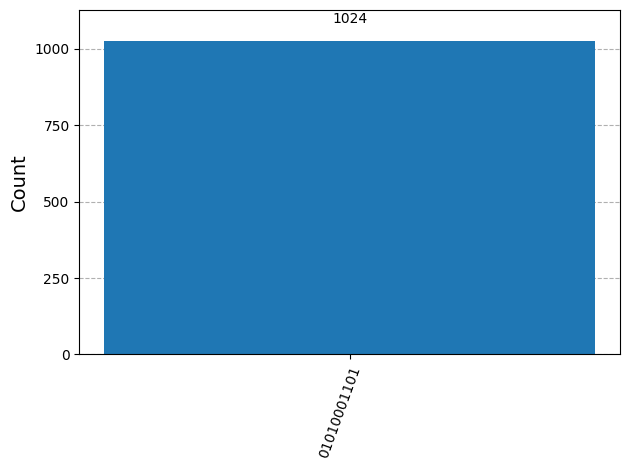

In [ ]:
# Ejecutamos el circuito para restar 1200 - 547 y mostramos los resultados:

qc = create_qft_substractor_circuit(11, 1200, 547)
qc.draw('mpl')

qc_transpiled = transpile(qc, aer)
result = aer.run(qc_transpiled, shots=1024).result()
counts = result.get_counts()
plot_histogram(counts)

Podemos comprobar que el resultado obtenido es el esperado: 1200 (10010110000) - 547 (1000100011) = 653 (01010001101).

## Ejercicio 3.3

Programe en Qiskit un circuito que realice la operación multiplicación y sea capaz de devolver:

53 (110101) * 4 (100) = 212 (0011010100)


**Solución:**

Para multiplicar dos enteros positivos $a$ y $b$, el circuito multiplicador QFT introduce un registro adicional de producto $P$:

- Un registro para $|a\rangle$.
- Un registro para $|b\rangle$ (sus bits $b_k$ se usarán como controles).
- Un registro de producto $|0\rangle$ sobre el que se aplica la QFT.

La idea es descomponer el producto como
$$
ab = \sum_k b_k\, a\, 2^k.
$$

1. Se aplica QFT al registro de producto.  
2. Para cada bit $b_k$ del multiplicador, se usa un bloque controlado $2^k \Sigma$:
   - Si $b_k = 1$, se suman $a \cdot 2^k$ unidades al registro de producto en la base de Fourier, mediante puertas de fase controladas.  
3. Finalmente se aplica la QFT inversa al registro de producto, obteniendo $|ab\rangle$.

Los bloques $2^k\Sigma$ del esquema del paper son los mismos bloques de suma basados en QFT del ejercicio 3.1, pero con las fases multiplicadas por $2^k$.


/tmp/ipykernel_371471/4145027453.py:32: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qc.append(QFT(num_qubits=2*n, do_swaps=True).to_gate(), range(3*n, total_qubits))
/tmp/ipykernel_371471/4145027453.py:43: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qc.append(QFT(num_qubits=2*n, do_swaps=True, inverse=True).to_gate(), range(3*n, total_qubits))


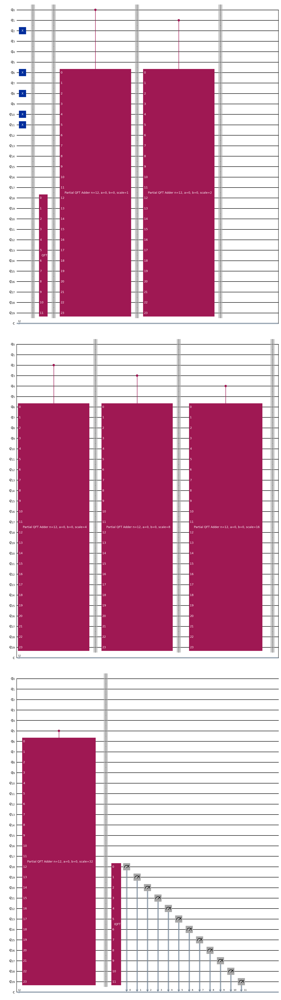

In [ ]:
# Utilizando la función creada en el ejercicio anterior, construimos un circuito multiplicador QFT

qc = create_qft_multiplier(6, 53, 4)
qc.draw('mpl')

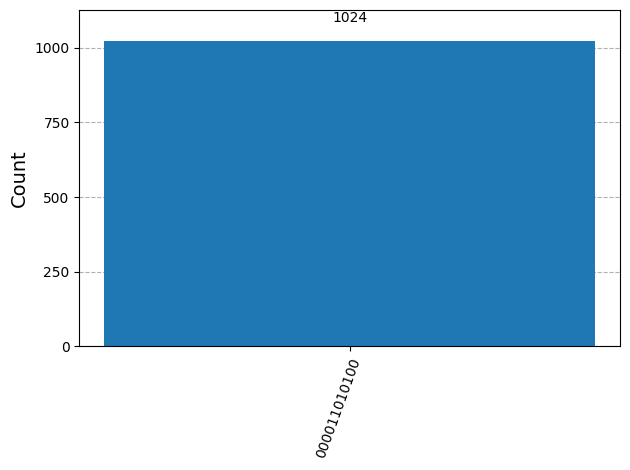

In [ ]:
# Ejecutamos el circuito multiplicador y mostramos los resultados

from qiskit_aer import AerSimulator
from qiskit import transpile
from qiskit.visualization import plot_histogram

aer = AerSimulator()
qc_transpiled = transpile(qc, aer)
result = aer.run(qc_transpiled, shots=1024).result()
counts = result.get_counts()
plot_histogram(counts)


Puede comprobarse que el resultado obtenido es el esperado: 53 (110101) * 4 (100) = 212 (0011010100).

## Ejercicio 3.4

Programe en Qiskit un circuito que realice la operación división y sea capaz de devolver:

12 (1100) / 5 (0101) = 2 (0010)

**Solución:**

La división entera puede construirse a partir de las operaciones anteriores, imitando los algoritmos clásicos de división:

- Mantener un registro para el **resto** y otro para el **cociente**.
- Inicialmente, el resto contiene el dividendo y el cociente es $0$.
- Repetidamente:
  - Se **resta** el divisor al resto usando el sustractor QFT.
  - Se **incrementa** el cociente en 1 usando el sumador QFT.
- El proceso se detiene cuando el resto es menor que el divisor.

En el artículo y en trabajos relacionados se describen divisores más generales, basados en comparadores y sumas controladas. En esta práctica usamos una versión simplificada basada en **restas repetidas implementadas con QFT**, suficiente para ilustrar cómo la suma y la resta QFT sirven de bloques básicos para construir un circuito de división entera.


In [ ]:
# ---------- 4) División entera: a // b usando restas repetidas con QFT ----------

from qiskit import QuantumRegister,ClassicalRegister, QuantumCircuit
import numpy as np


# ---------- Helper genérico: suma de constante en base de Fourier ----------
def fourier_phase_add_const(qc, qubits, const):
    """
    Aplica en la base de Fourier la suma de una constante entera 'const'
    sobre el registro 'qubits', usando puertas de fase P.
    """
    L = len(qubits)
    if L == 0:
        return
    modulus = 2 ** L
    const_mod = const % modulus  # para manejar también constantes negativas

    for j in range(L):
        angle = 2 * np.pi * const_mod / (2 ** (j + 1))
        qc.p(angle, qubits[j])


def qft_div(dividendo, divisor, shots=1024, draw=False):
    """
    División entera usando restas repetidas implementadas con sumador/sustractor QFT.

    - Registro 'rem' guarda el resto, inicializado con el dividendo.
    - Registro 'quot' guarda el cociente, inicializado a 0.
    - Se aplican tantas iteraciones de:
        rem  <- rem  - divisor   (con QFT)
        quot <- quot + 1         (con QFT)
      como indique el cociente clásico dividend // divisor.
    """
    if divisor == 0:
        raise ValueError("División por cero no definida")

    q = dividendo // divisor
    r = dividendo % divisor

    # Bits necesarios
    L_rem = max(dividendo, divisor).bit_length() + 1
    L_quot = max(1, q.bit_length() or 1)

    qrem = QuantumRegister(L_rem, 'rem')
    qquot = QuantumRegister(L_quot, 'quot')
    c_quot = ClassicalRegister(L_quot, 'c_quot')

    qc = QuantumCircuit(qrem, qquot, c_quot)

    # Inicializar resto con el dividendo
    for k in range(L_rem):
        if (dividendo >> k) & 1:
            qc.x(qrem[k])

    # Cociente empieza en |0...0>

    # Iteraciones de resta + incremento
    for _ in range(q):
        # rem = rem - divisor
        qc.append(QFT(num_qubits=L_rem, do_swaps=False).to_gate(label="QFT_rem"), qrem)
        fourier_phase_add_const(qc, qrem, -divisor)
        qc.append(QFT(num_qubits=L_rem, do_swaps=False, inverse=True).to_gate(label="QFT†_rem"), qrem)

        # quot = quot + 1
        qc.append(QFT(num_qubits=L_quot, do_swaps=False).to_gate(label="QFT_quot"), qquot)
        fourier_phase_add_const(qc, qquot, 1)
        qc.append(QFT(num_qubits=L_quot, do_swaps=False, inverse=True).to_gate(label="QFT†_quot"), qquot)

    # Medimos solo el cociente
    qc.measure(qquot, c_quot)

    backend = Aer.get_backend('qasm_simulator')
    circq = transpile(qc, backend)
    job = backend.run(circq, shots=shots)
    result = job.result()
    counts = result.get_counts()

    print(f"División entera (simplificada) QFT: {dividendo} / {divisor}")
    print(f"Cociente esperado: {q}, resto esperado: {r}")
    print(counts)

    display(qc.draw('mpl'))

    display(plot_histogram(counts))

    if draw:
        display(qc.draw('mpl'))

    return qc, counts

/tmp/ipykernel_371471/3962227189.py:61: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qc.append(QFT(num_qubits=L_rem, do_swaps=False).to_gate(label="QFT_rem"), qrem)
/tmp/ipykernel_371471/3962227189.py:63: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qc.append(QFT(num_qubits=L_rem, do_swaps=False, inverse=True).to_gate(label="QFT†_rem"), qrem)
/tmp/ipykernel_371471/3962227189.py:66: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circ

División entera (simplificada) QFT: 12 / 5
Cociente esperado: 2, resto esperado: 2
{'10': 1024}


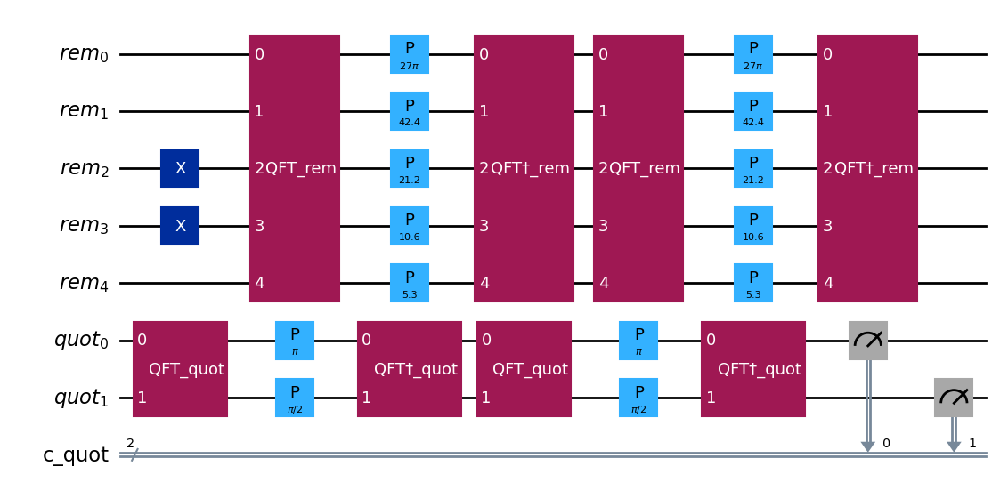

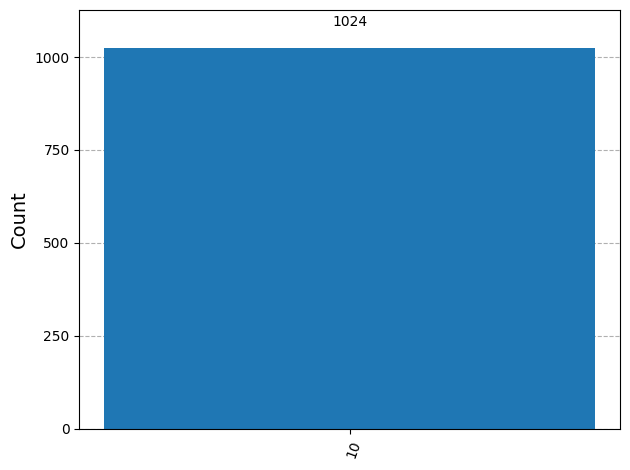

In [ ]:
qc_div, counts_div = qft_div(12, 5)

Vemos que el resultado obtenido es el esperado: 12 (1100) / 5 (0101) = 2 (0010).

# Ejercicio 4. QPE y QFT en el algoritmo de Shor.

Partiendo del código `ShorLabQCCEjercicio4.ipynb` que implementa el
algoritmo de Shor y crea el siguiente circuito

![image_4_1.png](images/image_4_1.png)

## Ejercicio 4.1

Realice cambios como el propio tutorial sugiere y explique para esta implementación en qué partes del algoritmo de Shor se están usando QPE y QFT y detalle su funcionamiento.

**Solución:**

El algoritmo de Shor permite la factorización eficiente de números enteros grandes utilizando un ordenador cuántico.

Para explicar el uso de QPE y QFT en el algoritmo de Shor, primero indicaremos que el problema de la factorización está estrechamente ligado al problema de encontrar el orden de un número $a$ módulo $N$ dentro de un grupo multiplicativo. El orden $r$ de un número $a$ módulo $N$ es el menor entero positivo tal que:
$$a^r = 1 \mod N$$

La factorización de un número compuesto $N$ puede reducirse a la búsqueda del orden $r$ de un número $a$ coprimo con $N$. Si se puede encontrar este orden $r$, se pueden obtener factores no triviales de $N$ utilizando el máximo común divisor (mcd).

Si sabemos que los números $a$ y $N$ son coprimos y el orden de $a$ módulo $N$ es $r$, entonces si $r$ es par y $a^{r/2} \neq -1 \mod N$, los números $a^{r/2}-1$ y $a^{r/2}+1$ comparten factores no triviales con $N$. Veamos por qué:
- podemos escribir:
  $a^r - 1 \equiv 0 \mod N$.
  Esto implica que $N$ divide a $a^r - 1$.
  Por tanto, podemos factorizar $a^r - 1$ como: $a^r - 1 = (a^{r/2} - 1)(a^{r/2} + 1)$
- Finalmente, basta buscar los factores comunes entre $N$ y cada uno de los factores anteriores.
Estos factores pueden ser encontrados calculando $\text{mcd}(a^{r/2}-1, N)$ y $\text{mcd}(a^{r/2}+1, N)$. La complejidad del algoritmo que permite enconntrar el máximo común divisor es polinómica (por ejemplo, el algoritmo de Euclides) y, por tanto, eficiente.

De este modo, si $N$ es el número que queremos factorizar, el algoritmo de Shor se puede resumir en los siguientes pasos:
1. Elegir un número $a$ al azar tal que $1 < a < N$ y $\text{mcd}(a, N) = 1$. Si $\text{mcd}(a, N) \neq 1$, hemos encontrado un factor no trivial de $N$, que es precisamente lo que queremos conseguir (hemos tenido mucha suerte :-) ).
2. Utilizar el algoritmo de QPE para encontrar el orden $r$ de $a$ módulo $N$. Para ello, se utiliza como oráculo la operación de multiplicación por $a$ módulo $N$.
3. Si $r$ es impar, o si $a^{r/2} \equiv -1 \mod N$, volvemos al paso 1. Si no, continuamos.
4. Finalmente, calculamos los factores no triviales de $N$ como $\text{mcd}(a^{r/2}-1, N)$ y $\text{mcd}(a^{r/2}+1, N)$.

En resumen, el algoritmo de Shor se basa en encontrar el orden $r$ de un elemento $a$ módulo $N$. Esto se traduce en un operador cuántico unitario $U$ tal que:

$$U|y\rangle \equiv |a \cdot y \pmod N\rangle$$

Los autostados de este operador, denotados como $|u_s\rangle$, tienen la propiedad fundamental relacionada con la fase:

$$U|u_s\rangle = e^{2\pi i \frac{s}{r}} |u_s\rangle$$

Donde la fase $\theta = \frac{s}{r}$ contiene la información sobre el periodo $r$ que buscamos.

**Uso de la QPE (Quantum Phase Estimation):**

La subrutina QPE es el bloque principal del circuito. Su objetivo es estimar la fase $\theta$ del operador $U$. En el código, esto se realiza utilizando dos registros de qubits:

1.  **Registro de Evaluación (`eval_register`):** Compuesto por $t$ qubits (donde $t = 2n$ idealmente). Se inicializan en superposición uniforme mediante puertas Hadamard $H$.
2.  **Registro de Autoestado (`eigen_register`):** Donde se aplica la operación modular. Se inicializa en el estado $|1\rangle$, el cual es una superposición de todos los autostados $|u_s\rangle$:
  $$|1\rangle = \frac{1}{\sqrt{r}} \sum_{s=0}^{r-1} |u_s\rangle$$

La QPE aplica una serie de puertas unitarias controladas $CU^{2^j}$. Debido al efecto de **retroceso de fase (phase kickback)**, la información de la fase se transfiere del registro de autoestado al registro de evaluación. Tras aplicar las puertas controladas, el estado del sistema (ignorando el registro de autoestado) es:

$$|\psi\rangle = \frac{1}{\sqrt{2^t}} \sum_{k=0}^{2^t-1} e^{2\pi i \theta k} |k\rangle$$

**Uso de la QFT Inversa ($QFT^\dagger$):**

Aquí es donde entra la Transformada Cuántica de Fourier. El estado resultante tras las operaciones controladas codifica la fase $\theta$ en las amplitudes de la **Base de Fourier**. Para poder medir este valor como un número binario en la **Base Computacional**, necesitamos aplicar la inversa de la QFT.


A continuación, se prueban diferentes combinaciones de A y N, tal como pide el enunciado:

N=15, a=13
Eigenstate qubits: 4
Evaluation qubits: 8


/tmp/ipykernel_371471/1207227890.py:61: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qft = QFT(num_qubits=eval_qubits)


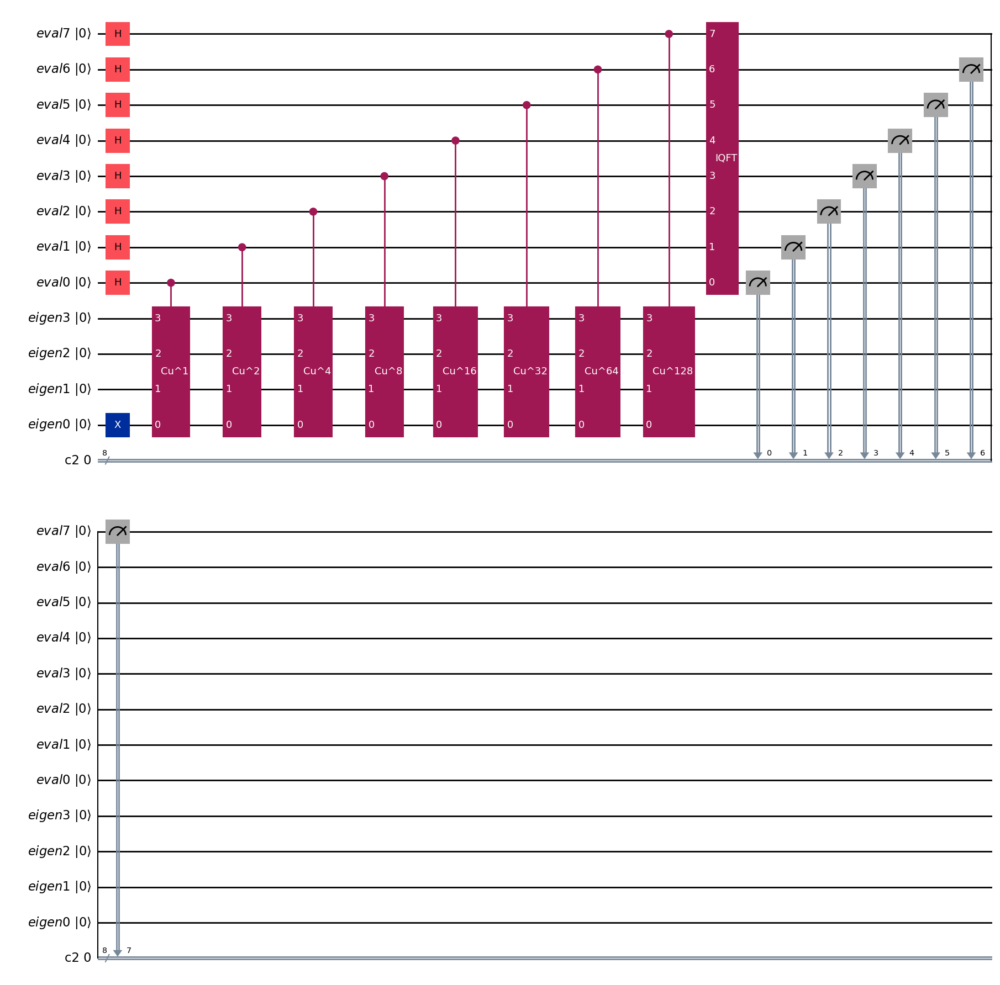

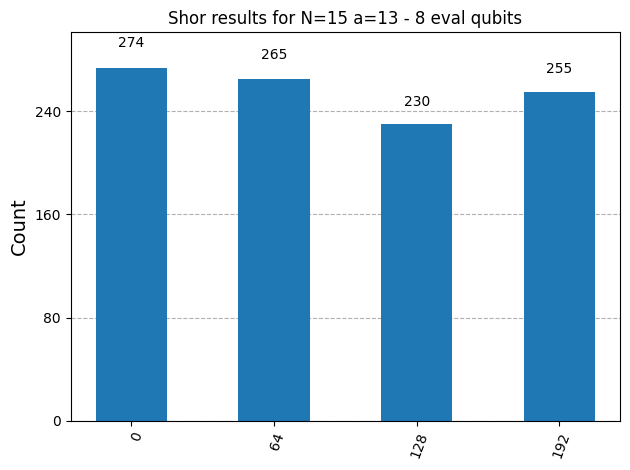

Order of element a=13 base N=15 is r=4
Factors of N=15 are p=5 and q=3
N=15, a=7
Eigenstate qubits: 4
Evaluation qubits: 8


/tmp/ipykernel_371471/1207227890.py:61: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qft = QFT(num_qubits=eval_qubits)


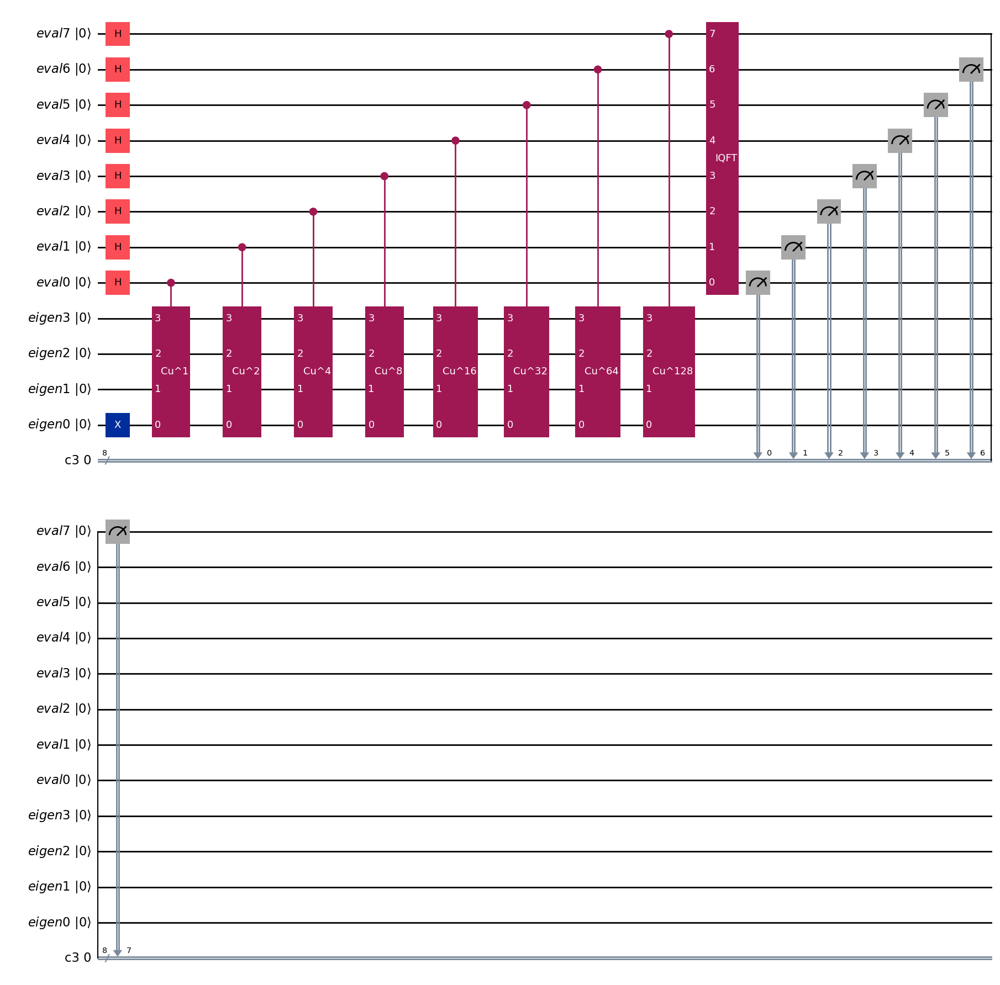

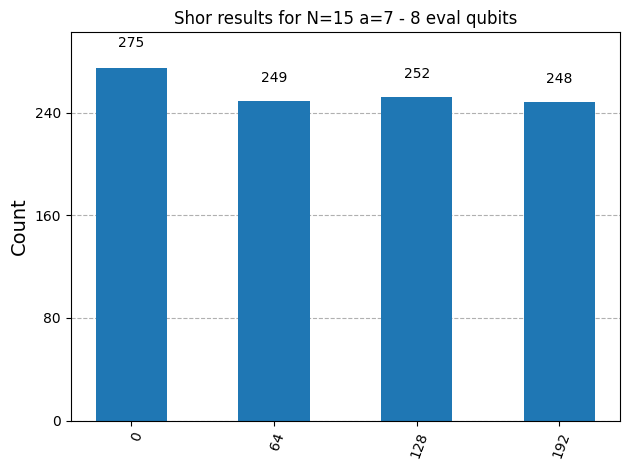

Order of element a=7 base N=15 is r=4
Factors of N=15 are p=5 and q=3
N=21, a=4
Eigenstate qubits: 5
Evaluation qubits: 9


/tmp/ipykernel_371471/1207227890.py:61: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qft = QFT(num_qubits=eval_qubits)


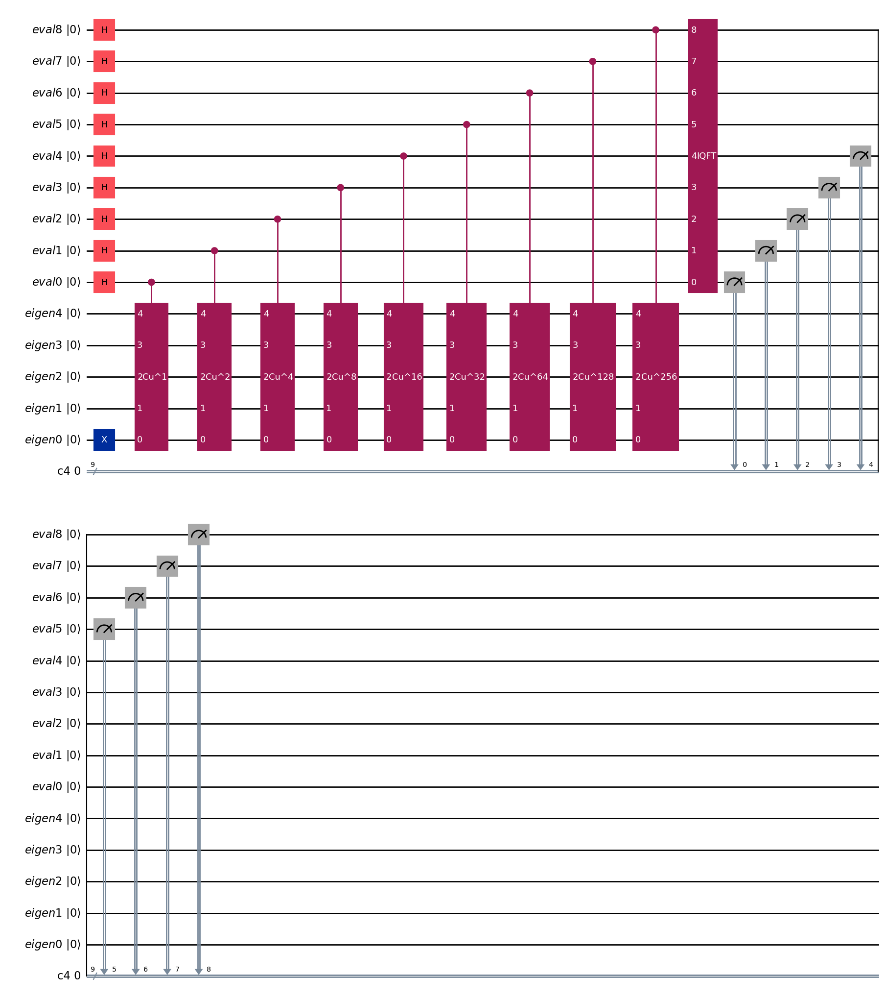

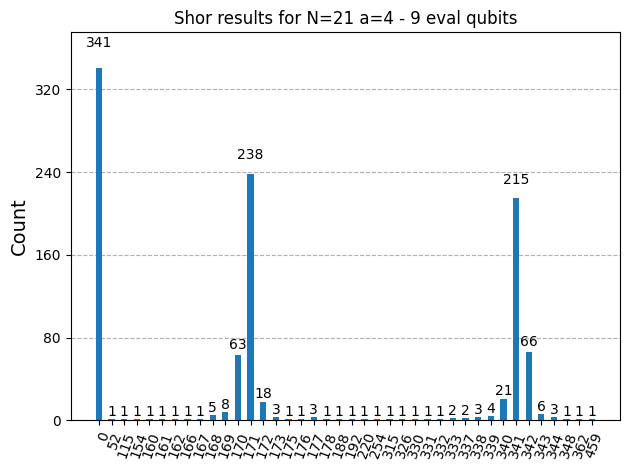

Order of element a=4 base N=21 is r=3
Order r=3 is not even! Try a different value of a
N=21, a=2
Eigenstate qubits: 5
Evaluation qubits: 9


/tmp/ipykernel_371471/1207227890.py:61: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qft = QFT(num_qubits=eval_qubits)


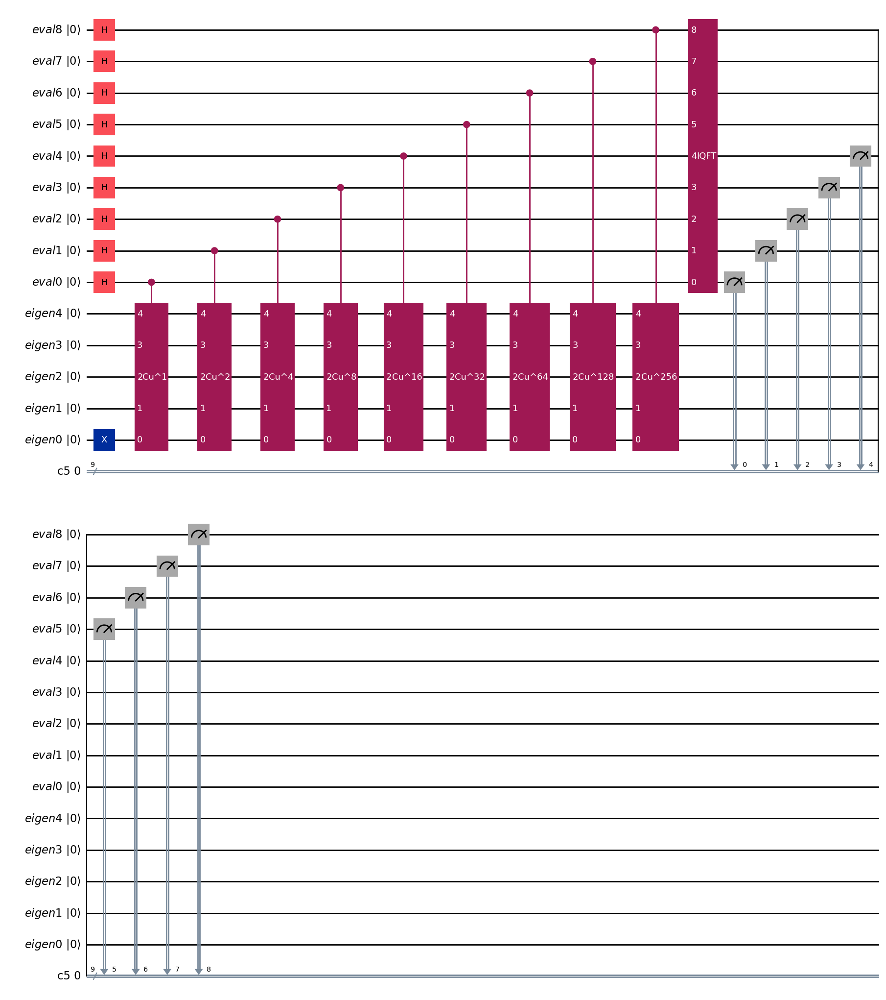

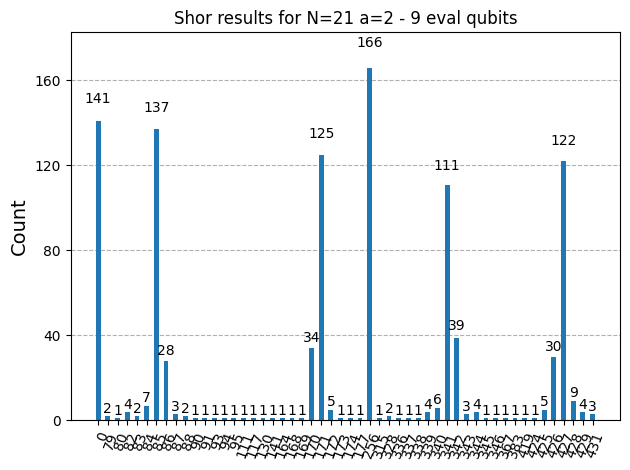

Order of element a=2 base N=21 is r=6
Factors of N=21 are p=3 and q=7


In [ ]:
from qiskit.circuit.library import UnitaryGate
from fractions import Fraction


Ns = [15, 15, 21, 21]
As = [13, 7, 4, 2]

for N, a in zip(Ns, As):
  print("=" * 80)
  print(f"N={N}, a={a}")
  print("=" * 80)
  # Calculate size of the eigenstate register
  eigen_qubits = math.ceil(np.log2(N))
  # Calculate size of the evaluation register
  eval_qubits = math.ceil(np.log2(pow(N, 2)))
  print(f"Eigenstate qubits: {eigen_qubits}")
  print(f"Evaluation qubits: {eval_qubits}")

  # Build circuit structure
  eigen_register = []
  for i in range(eigen_qubits):
      eigen_register.append(QuantumRegister(1, f"eigen{i}"))
  eval_register = []
  for i in range(eval_qubits):
      eval_register.append(QuantumRegister(1, f"eval{i}"))
  qc = QuantumCircuit(*eigen_register, *eval_register, ClassicalRegister(eval_qubits))

  # Circuit creation
  # Start state |1> on eigenstate register to superpose |us>
  qc.x(0)

  # Start hadamards on evaluation register
  # These will be part of the QPE circuit
  for i in range(eval_qubits):
      qc.h(i + eigen_qubits)


  # This creates operator U based on modular arithmetic
  def generate_base_matrix(a, N, eigen_qubits):
      # Build the matrix, which must support 2**eigen_qubits elements
      u = np.zeros([2 ** eigen_qubits, 2 ** eigen_qubits], dtype=int)
      # Elements in 0 <= i <= N-1
      for i in range(N):
          u[a * i % N][i] = 1
      # For the rest, it is irrelevant. We'll not deal with these states
      for i in range(N, 2 ** eigen_qubits):
          u[i][i] = 1
      return u

  # Build controlled U operators
  u = generate_base_matrix(a, N, eigen_qubits)
  for i in range(eval_qubits):
      power = pow(2, i)
      compound_u = np.linalg.matrix_power(u, power)
      compound_u_gate = UnitaryGate(compound_u)
      compound_u_gate.name = f"CU^{2 ** i}"
      controlled_u_gate = compound_u_gate.control()
      qc.append(controlled_u_gate, [i + eigen_qubits, *list(range(eigen_qubits))])

  # Inverse qft
  qft = QFT(num_qubits=eval_qubits)
  qft_inverse = qft.inverse()
  qc.append(qft_inverse, [i + eigen_qubits for i in range(eval_qubits)])

  # Assign measurements
  for i in range(eval_qubits):
      qc.measure(i + eigen_qubits, i)

  # Draw
  display(qc.draw('mpl', initial_state=True, reverse_bits=True))


  # Simulate the circuit
  simulator = AerSimulator()
  qct = transpile(qc, simulator) # Without this, the simulator can't execute the circuit
  result = simulator.run(qct, shots=1024).result()
  data = result.get_counts(qct)
  # Make data decimal for easier viewing
  data_dec = dict()
  for bin_key in data.keys():
      data_dec[int(bin_key, 2)] = data[bin_key]
  display(plot_histogram(data_dec, title=f"Shor results for N={N} a={a} - {eval_qubits} eval qubits"))

  # Order the values by largest measurement
  sorted_measurements = [key for key, _ in sorted(data_dec.items(), key=lambda item: item[1], reverse=True)]

  # Try multiple measurements to see if any work
  found = False
  i = 0
  r = 0
  while not found and i < len(sorted_measurements):
    v = sorted_measurements[i]
    frac = Fraction(v, 2**eval_qubits)
    test_order = frac.limit_denominator(max_denominator=N).denominator
    if pow(a, test_order, N) == 1:
      found = True
      r = test_order
    else:
      i += 1

  if found:
    print(f"Order of element a={a} base N={N} is r={r}")
  else:
    print(f"Order not found :-(. Try running again")

  # Classical part of Shor
  p = 0
  q = 0
  if math.gcd(a, N) == 1:
    if r%2 == 0:
      lv = pow(a, r//2) + 1
      rv = pow(a, r//2) - 1
      p_test = math.gcd(lv, N)
      q_test = math.gcd(rv, N)
      if p_test*q_test == N:
        p = p_test
        q = q_test
      else:
        print(f"p*q is not N. Try a different value of a")
    else:
      print(f"Order r={r} is not even! Try a different value of a")
  else:
    print(f"Lucky, a={a} is already a factor of N={N}")
    p = a
    q = N//a

  if p*q != 0:
    print(f"Factors of N={N} are p={p} and q={q}")

# Ejercicio 5. Programación con Pennylane

Revise el siguiente enlace que describe en detalle el uso de la QFT para realizar operaciones aritméticas.

[https://pennylane.ai/qml/demos/tutorial_qft_arithmetics](https://pennylane.ai/qml/demos/tutorial_qft_arithmetics)





**Solución:**

En primer lugar, veamos la implementación de la suma en Pennylane:



## Ejercicio 5.1

Entienda el funcionamiento de las implementaciones de suma y multiplicación desarrolladas en Pennylane en el enlace anterior y explique comparativamente las diferencias (si las hubiera) con las implementaciones realizadas en qiskit en los ejercicios anteriores.


In [ ]:
import pennylane as qml
import numpy as np
import matplotlib.pyplot as plt

n_wires = 4
dev = qml.device("default.qubit", wires=n_wires)

def add_k_fourier(k, wires):
    for j in range(len(wires)):
        qml.RZ(k * np.pi / (2**j), wires=wires[j])

@qml.set_shots(1)
@qml.qnode(dev)
def qsum(m, k):
    qml.BasisEmbedding(m, wires=range(n_wires))  # m encoding

    qml.QFT(wires=range(n_wires))  # step 1

    add_k_fourier(k, range(n_wires))  # step 2

    qml.adjoint(qml.QFT)(wires=range(n_wires))  # step 3

    return qml.sample()


print(f"The ket representation of the sum of 3 and 4 is {qsum(3,4)}")

The ket representation of the sum of 3 and 4 is [[0 1 1 1]]


The ket representation of the sum of 7 and 3 is [[1 0 1 0]]


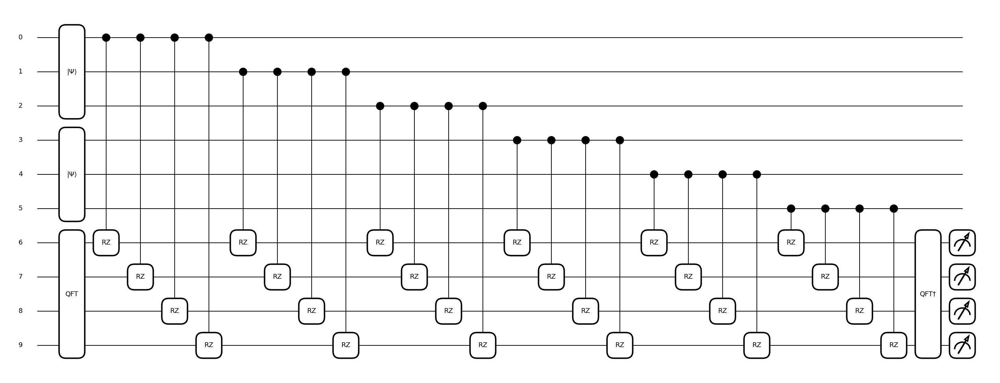

In [ ]:
wires_m = [0, 1, 2]             # qubits needed to encode m
wires_k = [3, 4, 5]             # qubits needed to encode k
wires_solution = [6, 7, 8, 9]   # qubits needed to encode the solution

dev = qml.device("default.qubit", wires=wires_m + wires_k + wires_solution)

n_wires = len(dev.wires) # total number of qubits used

def addition(wires_m, wires_k, wires_solution):
    # prepare solution qubits to counting
    qml.QFT(wires=wires_solution)

    # add m to the counter
    for i in range(len(wires_m)):
        qml.ctrl(add_k_fourier, control=wires_m[i])(2 **(len(wires_m) - i - 1), wires_solution)

    # add k to the counter
    for i in range(len(wires_k)):
        qml.ctrl(add_k_fourier, control=wires_k[i])(2 **(len(wires_k) - i - 1), wires_solution)

    # return to computational basis
    qml.adjoint(qml.QFT)(wires=wires_solution)

@qml.set_shots(1)
@qml.qnode(dev)
def sum2(m, k, wires_m, wires_k, wires_solution):
    # m and k codification
    qml.BasisEmbedding(m, wires=wires_m)
    qml.BasisEmbedding(k, wires=wires_k)

    # apply the addition circuit
    addition(wires_m, wires_k, wires_solution)

    return qml.sample(wires=wires_solution)

print(f"The ket representation of the sum of 7 and 3 is "
      f"{sum2(7, 3, wires_m, wires_k, wires_solution)}")

qml.draw_mpl(sum2, show_all_wires=True)(7, 3, wires_m, wires_k, wires_solution)
plt.show()

Comparemos este circuito con nuestra implementación en Qiskit:

/tmp/ipykernel_371471/3292416943.py:39: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qc.append(QFT(num_qubits=n+1, do_swaps=True).to_gate(), range(n, total_qubits))
/tmp/ipykernel_371471/3292416943.py:49: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qc.append(QFT(num_qubits=n+1, do_swaps=True, inverse=True).to_gate(), range(n, total_qubits))


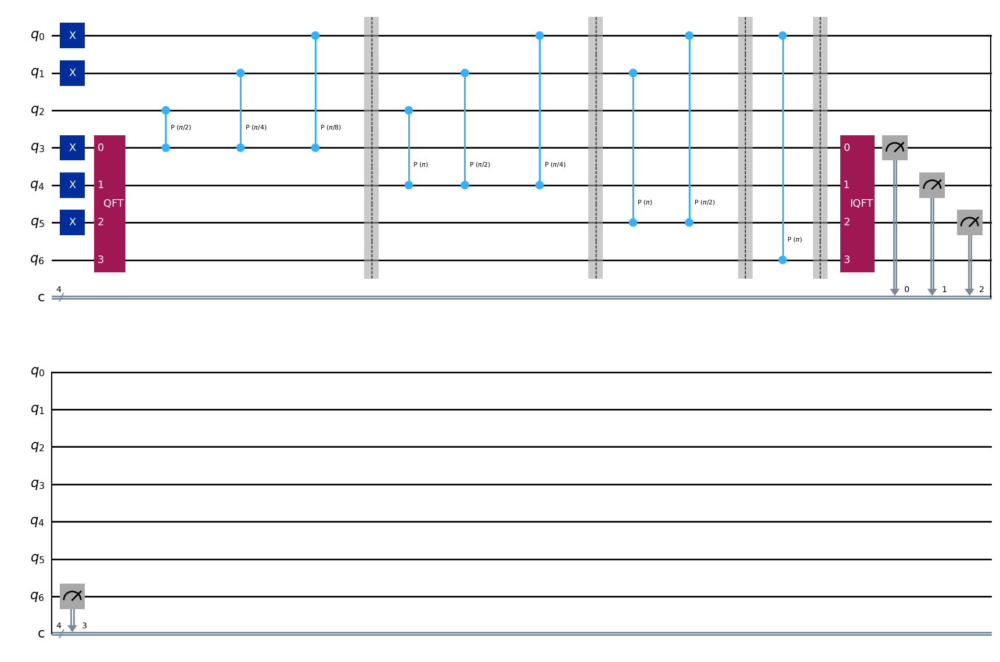

In [ ]:
qc = create_qft_adder_circuit(3, 7, 3)
qc.draw('mpl')

Más allá de las diferencias ligadas directamente a los dos frameworks utilizados (Pennylane y Qiskit), hay varias diferencias en las implementaciones de los circuitos sumadores:

1. En la implementación de Pennylane la suma se realiza mediante el uso de puertas controladas de rotación de fase (CZ) sobre un registro de qubits ancilla inicializados en la QFT del estado $|0\rangle$. Es decir, en primer lugar se añaden en el dominio de Fourier las fases correspondientes al sumando $a$ mediante puertas CZ controladas por los qubits de $a$ sobre el último registro inicializado en la QFT del estado $|0\rangle$; a continuación, se realiza la misma operación con el sumando $b$. En cambio, en la implementación de Qiskit, la suma se realiza mediante la aplicación de puertas controladas de rotación de fase (CZ) por los qubits del sumando $b$ sobre los qubits de la QFT del sumando $a$ a los que se ha añadido un qubit extra, inicalizado en el estado $|0\rangle$, para evitar desbordamiento y dar cabida al posible acarreo final de la suma.

2. Por tanto, si el número de qubits de $a$ y $b$ es $n$, en la implementación de Pennylane se utilizan $3n+1$ qubits (los $n$ qubits de $a$, los $n$ qubits de $b$ y los $n+1$ qubits ancilla para almacenar el resultado de la suma). En cambio, en la implementación de Qiskit se utilizan $2n +1$ qubits (los $n$ qubits de $a$ y los $n$ qubits de $b$ más un qubit inicializado a $|0\rangle$ para dar cabida al posible acarreo final).

3. Vemos, por tanto, que la impementación que hemos realizado en Qiskit es más eficiente en cuanto al número de qubits necesarios para realizar la suma.

4. También hay diferencias en el modo de inicializar los registros. En Pennylane, los registros de $a$ y $b$ se inicializan directamente en el estado binario correspondiente al número que representan (mediante la preparación del estado, con `qml.BasisState`), mientras que en Qiskit utilizamos puertas X para poner a 1 los qubits correspondientes.

Veamos ahora la implementación de la multiplicación en Pennylane:

The ket representation of the multiplication of 3 and 7 is [[1 0 1 0 1]]


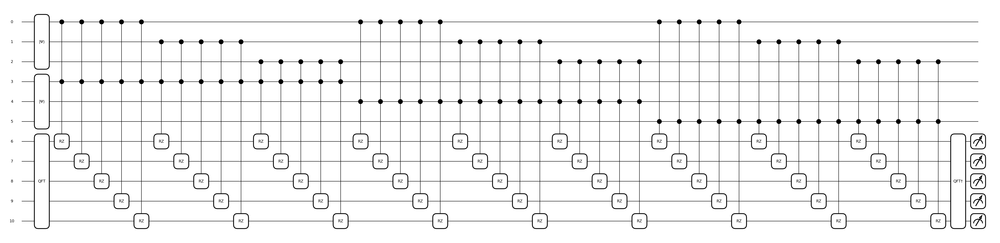

In [ ]:
wires_m = [0, 1, 2]           # qubits needed to encode m
wires_k = [3, 4, 5]           # qubits needed to encode k
wires_solution = [6, 7, 8, 9, 10]  # qubits needed to encode the solution

dev = qml.device("default.qubit", wires=wires_m + wires_k + wires_solution)

n_wires = len(dev.wires)

def multiplication(wires_m, wires_k, wires_solution):
    # prepare sol-qubits to counting
    qml.QFT(wires=wires_solution)

    # add m to the counter
    for i in range(len(wires_k)):
        for j in range(len(wires_m)):
            coeff = 2 ** (len(wires_m) + len(wires_k) - i - j - 2)
            qml.ctrl(add_k_fourier, control=[wires_k[i], wires_m[j]])(coeff, wires_solution)

    # return to computational basis
    qml.adjoint(qml.QFT)(wires=wires_solution)

@qml.set_shots(1)
@qml.qnode(dev)
def mul(m, k):
    # m and k codification
    qml.BasisEmbedding(m, wires=wires_m)
    qml.BasisEmbedding(k, wires=wires_k)

    # Apply multiplication
    multiplication(wires_m, wires_k, wires_solution)

    return qml.sample(wires=wires_solution)


print(f"The ket representation of the multiplication of 3 and 7 is {mul(3,7)}")

qml.draw_mpl(mul, show_all_wires=True)(3, 7)
plt.show()

Comparemos con el circuito de multiplicación que hemos implementado en Qiskit:

/tmp/ipykernel_371471/4145027453.py:32: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qc.append(QFT(num_qubits=2*n, do_swaps=True).to_gate(), range(3*n, total_qubits))
/tmp/ipykernel_371471/4145027453.py:43: DeprecationWarning: The class ``qiskit.circuit.library.basis_change.qft.QFT`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. ('Use qiskit.circuit.library.QFTGate or qiskit.synthesis.qft.synth_qft_full instead, for access to all previous arguments.',)
  qc.append(QFT(num_qubits=2*n, do_swaps=True, inverse=True).to_gate(), range(3*n, total_qubits))


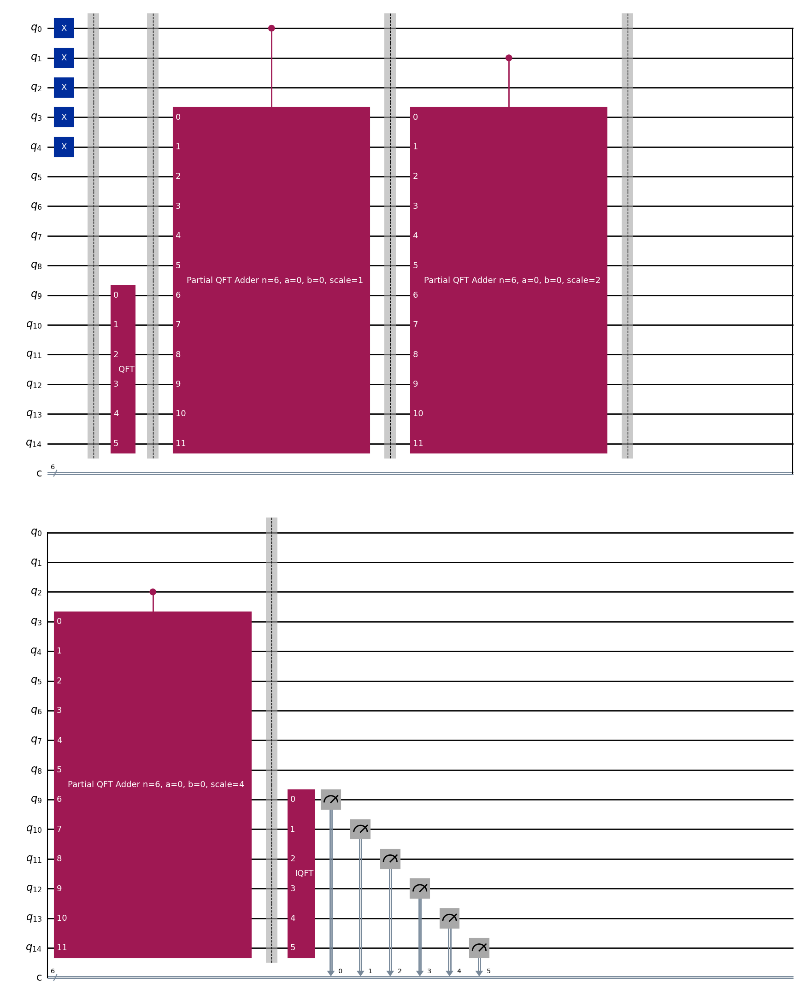

In [ ]:
qc = create_qft_multiplier(3, 3, 7)
qc.draw('mpl')

La implementación en Pennylane de la multiplicación, de nuevo, es ligeramente diferente a la que hemos realizado en Qiskit:

1. En la implementación en Pennylane se parte de un registro de qubits inicializados en la QFT del estado $|0\rangle$ para almacenar el resultado de la multiplicación. A continuación se añaden en el dominio de Fourier las fases correspondientes a las multiplicaciones de los qubits con valor 1 de ambos multiplicandos sobre el registro ancilla, según la expresión $k \cdot m = \sum_{i=0}^{n-1} \sum_{j=0}^{l-1} k_i m_j (2^{n-i-1} \cdot 2^{l-j-1}) = \sum_{i=0}^{n-1} \sum_{j=0}^{l-1} k_i m_j 2^{n + l - i - j - 2}$. Para ello se utilizan puertas CZ controladas por las combinaciones de qubits de ambos multiplandos para los cuales el valor es 1. Es decir, se utilizan puertas CZ controladas por dos qubits.

2. En cambio, en la implementación de Qiskit, la multiplicación se realiza como una concatenación de sumas de fase, en el dominio de Fourier, controladas por los qubits del multiplicando $b$ sobre el registro que contiene la QFT del multiplicando $a$ sobre un registro ancilla inicializado en la QFT del estado $|0\rangle$. Cada una de estas sumas esta ponderada por $2^{j}$, siendo $j$ la posición del qubit del multiplicando $b$ que controla la suma.

   En este caso, la implementación realizada en Qiskit no es todo lo eficiente que podría ser, ya que por simplicidda se ha reutilizado parte del código de la suma, en el dominio de Fourier, en la que el sumador actúa sobre $2n$ qubits para poder dar cabida a todos los posibles resultado se la multipicación de números de $n$ bits.


## Ejercicio 5.2

División entera.

Partiendo del código en pennylane que realiza la división entera:
[https://github.com/KetpuntoG/Notebooks-del-canal/blob/master/DivisionEntera.ipynb](https://github.com/KetpuntoG/Notebooks-del-canal/blob/master/DivisionEntera.ipynb).
Y con la descripción de la división disponible en el canal |Ket.G>
[https://www.youtube.com/watch?v=xWZpVEIVwXs](https://www.youtube.com/watch?v=xWZpVEIVwXs) de Guillermo Alonso, explique el funcionamiento del circuito y compruebe su funcionamiento con
diferentes ejemplos.



**Solución:**

Veamos la implementación de la división en Pennylane:

In [ ]:
import pennylane as qml
from pennylane import numpy as np


def add_k_fourier(k, wires):
    """
    Esta función suma fases en el dominio de fourier mediante puertas de rotación de fase sobre los
    quibits de un registro.
    """
    for j in range(len(wires)):
        qml.RZ(k * np.pi / (2**j), wires=wires[j])


def substract_m_n(wires_m, wires_n):
    """
    Esta función resta las fases de dos números en el dominio de fourier mediante puertas de rotación de
    fase controladas por quibits de un registro.
    """
    # |m>|n> ->  |m - n> |n>

    # En primer lugar, se aplica la Transformada de Fourier Cuántica (QFT) al registro que contiene el número m
    qml.QFT(wires = wires_m)

    # Después se añaden las fases correspondientes a cada qubit del registro n con valor negativo.
    for i in range(len(wires_n)):
        qml.ctrl(add_k_fourier, control=wires_n[i])(-2 **(len(wires_n) - i - 1), wires_m)

    qml.adjoint(qml.QFT)(wires = wires_m)

dev = qml.device("default.qubit", wires = 6, shots = 1)


# A continuación, se prueba la resta: 4 - 2
@qml.qnode(dev)
def circuit():
    qml.BasisEmbedding(4, wires = range(3))
    qml.BasisEmbedding(2, wires = range(3,6))
    substract_m_n(range(3), range(3,6))
    return qml.sample(wires = range(3))

res = circuit()
print("\nResultado de la resta 4 - 2:", int("".join([str(v) for v in res[0]]), 2))



Resultado de la resta 4 - 2: 2


/home/jdpq/UAM/LCC/.conda/lib/python3.12/site-packages/pennylane/devices/device_api.py:193: PennyLaneDeprecationWarning: Setting shots on device is deprecated. Please use the `set_shots` transform on the respective QNode instead.
  warnings.warn(


In [ ]:
def is_greater(wires_m, wires_n, wires_aux, wires_target):
    """
    Esta función implementa un comparador cuántico. Determina si un número m (en el registro wires_m)
    es mayor que otro número (en el registro wires_n).
    """
    # 1. Se añade un qubit auxiliar al registro que conteine m
    wires_m_aux = [wires_aux] + list(wires_m)
    # 2. Se resta m - n
    substract_m_n(wires_m_aux, wires_n)

    # 3. Se invierte el qubit auxiliar, que debe ser 0 si m > n y 1 en caso contrario.
    qml.PauliX(wires = wires_aux)
    # 4. Se copia el qubit auxiliar invertido en el qubit destinado a contener el resultado de
    # esta comparación.
    qml.CNOT(wires = [wires_aux, wires_target])
    # 5. Se vuelve a invertir el qubit auxiliar para restaurarlo a su estado inicial.
    qml.PauliX(wires = wires_aux)
    # 6 Se deshace la operación de resta.
    qml.adjoint(substract_m_n)(wires_m_aux, wires_n)
    # El resultado queda en el qubit identificado por wires_target

dev = qml.device("default.qubit", wires = 8, shots = 1)

@qml.qnode(dev)
def circuit():
    qml.BasisEmbedding(3, wires = range(3))
    qml.BasisEmbedding(3, wires = range(3,6))
    is_greater(range(3), range(3,6), 6, 7)
    return qml.sample(wires = 7)

circuit()

array([[1]])

In [ ]:
wires_dividendo = [0,1,2,3,4,5]
wires_divisor = [6,7,8,9]
wires_aux_dividendo = [10,11,12]
wires_solucion = [13,14,15,16,17,18]
wires_aux = 19


def division(wires_dividendo, wires_divisor, wires_aux_dividendo, wires_solucion, wires_aux):
    """
    Esta función implementa un circuito cuántico que realiza la división de dos números enteros
    representados en binario, utilizando un algoritmo de división cuántica.

    La división se realiza mediante un algoritmo de división por restas sucesivas,
    donde se compara el dividendo con el divisor para determinar cuántas veces el divisor
    puede ser restado del dividendo.
    """
    # 1. Se crea un registro extendido combinando los qubits auxiliares con el dividendo
    # para manejar posibles desbordamientos.
    wires_dividendo_totales = wires_aux_dividendo + wires_dividendo

    # 2. Se itera sobre cada qubit del registro de la solución (cociente)
    for i in range(len(wires_solucion)):
        # 2.1. Se define la ventana del dividendo que se va a comparar con el divisor.
        # Es una ventana deslizante que se mueve a lo largo del registro del dividendo.
        window = wires_dividendo_totales[i - 1: len(wires_divisor)+ i]
        if i == 0:
            # En la primera iteración, la ventana es del mismo tamaño que el divisor
            window = wires_dividendo_totales[0: len(wires_divisor)]
        # 2.2. Determina si la porción actual del dividendo es mayor o igual al divisor.
        # El resultado se almacena en wires_solucion[i].
        is_greater(window, wires_divisor, wires_aux, wires_solucion[i])
        # 2.3. Si la porción del dividendo es mayor o igual al divisor, se resta el divisor
        # de dicha porción del dividendo. Esta resta está controlada por el qubit
        # wires_solucion[i], que indica si se debe realizar la resta o no.
        qml.ctrl(substract_m_n, control = wires_solucion[i])(window, wires_divisor)



dev = qml.device("default.qubit", wires = 20, shots = 1)

@qml.qnode(dev)
def circuit():
    qml.BasisEmbedding(32, wires = wires_dividendo)
    qml.BasisEmbedding(13, wires = wires_divisor)
    division(wires_dividendo, wires_divisor, wires_aux_dividendo, wires_solucion, wires_aux)


    return qml.sample(wires = wires_dividendo + wires_divisor + wires_solucion)

circuit()

array([[0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0]])

El notebook `DivisionEntera.ipynb` implementa un algoritmo de **división entera cuántica** basado completamente en operaciones de suma, resta y comparación realizadas mediante la Transformada de Fourier Cuántica (QFT). El objetivo del circuito es calcular, a partir de dos enteros clásicos $a$ (dividendo) y $b$ (divisor):

- el **cociente entero** $\lfloor a/b \rfloor$,
- y el **resto** $a \bmod b$.

Todo el proceso replica exactamente el algoritmo clásico de **división larga binaria**, pero utilizando bloques cuánticos reversibles.

---

**1. Rutina `add_k_fourier(k, wires)`**

Esta subrutina implementa la suma de una constante clásica $k$ sobre un registro que se encuentra en la base de Fourier. Para cada qubit $j$ se aplica la rotación:

$$
R_Z\left(\frac{k\pi}{2^j}\right)
$$

En la base de Fourier, estas rotaciones equivalen exactamente a realizar:

$$
|m\rangle \rightarrow |m + k\rangle
$$

tras aplicar posteriormente la QFT inversa. Esta rutina es la base tanto de la suma como de la resta.

---

**2. Rutina `substract_m_n(wires_m, wires_n)`**

Esta función implementa la transformación:

$$
|m\rangle |n\rangle \rightarrow |m - n\rangle |n\rangle
$$

El procedimiento es:

1. Aplicar `QFT` sobre el registro $|m\rangle$.
2. Para cada bit activo de $n$, aplicar de forma controlada `add_k_fourier` con coeficiente negativo.
3. Aplicar la QFT inversa.

Como sumar $-n$ en la base de Fourier equivale a restar $n$ en la base computacional, esta rutina implementa una **resta cuántica exacta y reversible**.

---

**3. Rutina `is_greater(wires_m, wires_n, wires_aux, wires_target)`**

Esta subrutina implementa un **comparador cuántico** que determina si $m \ge n$ y almacena el resultado en un qubit objetivo.

El procedimiento es el siguiente:

1. Se extiende el registro de $m$ con un qubit auxiliar más significativo.
2. Se calcula $m - n$ usando `substract_m_n`.
3. Si $m < n$, aparece un desbordamiento en complemento a dos y el bit auxiliar pasa a $|1\rangle$.
4. Se invierte el bit auxiliar y se copia su valor al qubit `wires_target` mediante una `CNOT`, de modo que:

- `wires_target = 1` si $m \ge n$,
- `wires_target = 0$ si $m < n$.

5. Finalmente se deshace la resta aplicando la rutina inversa, eliminando cualquier basura cuántica.

Este bloque cumple exactamente el rol del comparador clásico usado en la división larga.

---

**4. Rutina principal `division(...)`**

Esta función implementa el algoritmo completo de **división larga binaria cuántica**. Se utilizan los siguientes registros:

- `wires_dividendo`: contiene el dividendo $a$.
- `wires_divisor`: contiene el divisor $b$.
- `wires_aux_dividendo`: qubits auxiliares que amplían el registro del dividendo.
- `wires_solucion`: almacena el cociente.
- `wires_aux`: qubit auxiliar del comparador.

Se construye un registro extendido concatenando los auxiliares con el dividendo, de forma que se pueda desplazar una **ventana del tamaño del divisor** sobre el dividendo.

Para cada bit del registro `wires_solucion` se realiza:

1. Se selecciona una ventana del dividendo extendido.
2. Se compara la ventana con el divisor usando `is_greater`.
3. Si la ventana es mayor o igual que el divisor:
   - el bit del cociente se pone a $1$,
   - se resta el divisor a la ventana con `substract_m_n`.
4. Si no:
   - el bit del cociente permanece en $0$.

Este procedimiento es equivalente, bit a bit, al algoritmo clásico de división larga, pero implementado de forma completamente reversible y cuántica.

---

**5. Ejemplo de funcionamiento**

Para el ejemplo del notebook:

- dividendo $a = 32$,
- divisor $b = 13$,

el resultado correcto es:

$$
32 / 13 = 2 \quad \text{con resto } 6
$$

En el estado final del circuito:

- el registro `wires_solucion` contiene el valor binario de $2$,
- el registro del dividendo extendido contiene el valor binario del resto $6$,
- el registro del divisor permanece inalterado.

Esto verifica que el circuito calcula correctamente tanto el **cociente entero** como el **resto** de la división.

---

** Conclusión**

El circuito de división entera en PennyLane implementa correctamente:

- el cálculo de $\lfloor a/b \rfloor$,
- el cálculo del resto $a \bmod b$,

utilizando exclusivamente:

- suma y resta en la base de Fourier,
- comparación cuántica,
- control condicional,
- y un esquema de ventana deslizante inspirado en la división larga binaria clásica.

Este enfoque demuestra cómo operaciones aritméticas complejas pueden descomponerse en bloques cuánticos elementales construidos a partir de la QFT.


# Ejercicio 6. Ejecución en ordenadores cuánticos y simulaciones con ruido

## Ejercicio 6.1

Partiendo del siguiente circuito

![image_6_1.png](images/image_6_1.png)

que implementa un estado GHZ con entrelazamiento y salida conocida, similar al siguiente resultado:

![image_6_2.png](images/image_6_2.png)

a) Ejecute el circuito en un ordenador cuántico real y compare con el resultado obtenido en simulación. Indique las características del ordenador real utilizado. De las muestras obtenidas ¿Qué porcentaje del total han sido resultados no validos?



**Solución:**

In [ ]:
#!pip install qiskit-ibm-runtime

Creamos el circuito generador de estados GHZ:

In [ ]:
from qiskit import QuantumCircuit
from qiskit.visualization import plot_histogram, plot_distribution

def create_ghz_circuit():
    qc = QuantumCircuit(3, 3, name="GHZ Circuit")
    qc.h(0)
    qc.cx(0, 1)
    qc.cx(1, 2)
    qc.measure(range(3), range(3))
    return qc

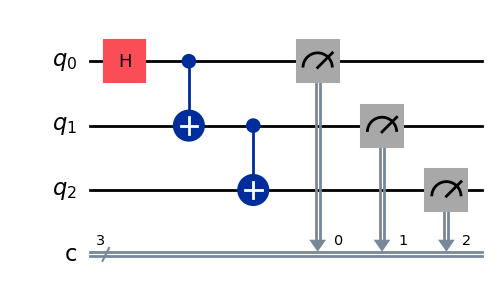

In [ ]:
qc_ghz = create_ghz_circuit()
qc_ghz.draw('mpl')

Ejecutamos el circuito en el simulador Aer:

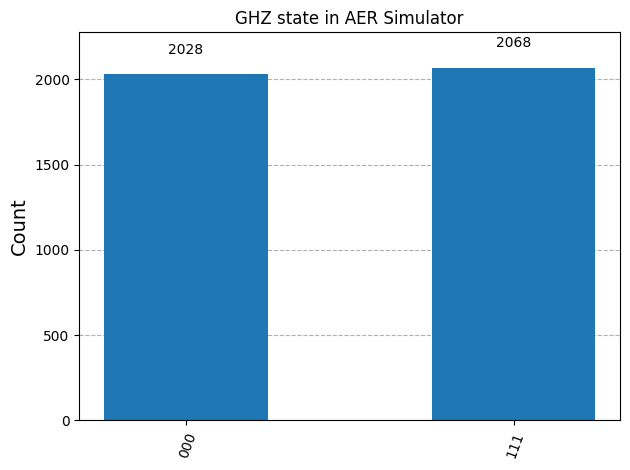

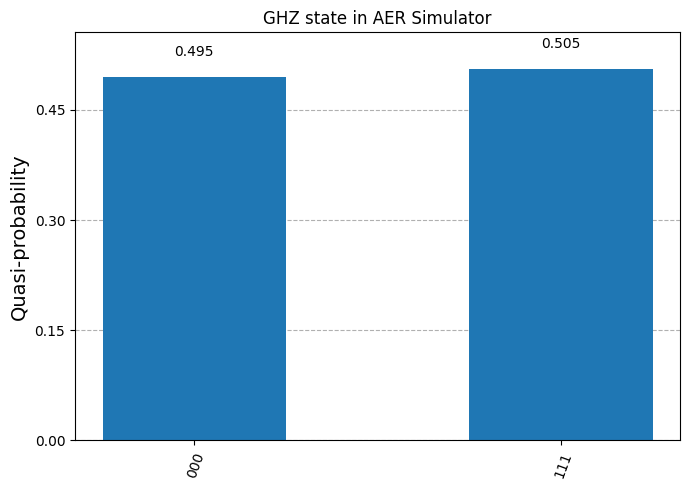

In [ ]:
aer = AerSimulator()
qc_transpiled_aer = transpile(qc_ghz, aer)
result_aer = aer.run(qc_transpiled_aer, shots=4096).result()
counts_aer = result_aer.get_counts()
display(plot_histogram(counts_aer, title="GHZ state in AER Simulator"))
display(plot_distribution(counts_aer, title="GHZ state in AER Simulator"))

A continuación, ejecutamos el circuito en un backend real:

In [ ]:
from qiskit_ibm_runtime import QiskitRuntimeService
from qiskit.transpiler import generate_preset_pass_manager

# Run every time you need the service
service = QiskitRuntimeService()

qiskit_runtime_service.__init__:WARNING:2025-12-13 20:22:31,202: Instance was not set at service instantiation. Free and trial plan instances will be prioritized. Based on the following filters: (tags: None, region: us-east, eu-de), and available plans: (open), the available account instances are: open-instance. If you need a specific instance set it explicitly either by using a saved account with a saved default instance or passing it in directly to QiskitRuntimeService().


In [ ]:
from qiskit_ibm_runtime import QiskitRuntimeService

service = QiskitRuntimeService()

backend = service.least_busy(simulator=False, operational=True)

qiskit_runtime_service.__init__:WARNING:2025-12-13 20:22:36,372: Instance was not set at service instantiation. Free and trial plan instances will be prioritized. Based on the following filters: (tags: None, region: us-east, eu-de), and available plans: (open), the available account instances are: open-instance. If you need a specific instance set it explicitly either by using a saved account with a saved default instance or passing it in directly to QiskitRuntimeService().
qiskit_runtime_service.backends:WARNING:2025-12-13 20:22:36,843: Loading instance: open-instance, plan: open
qiskit_runtime_service.backends:WARNING:2025-12-13 20:22:38,805: Using instance: open-instance, plan: open


In [ ]:
backend

<IBMBackend('ibm_torino')>

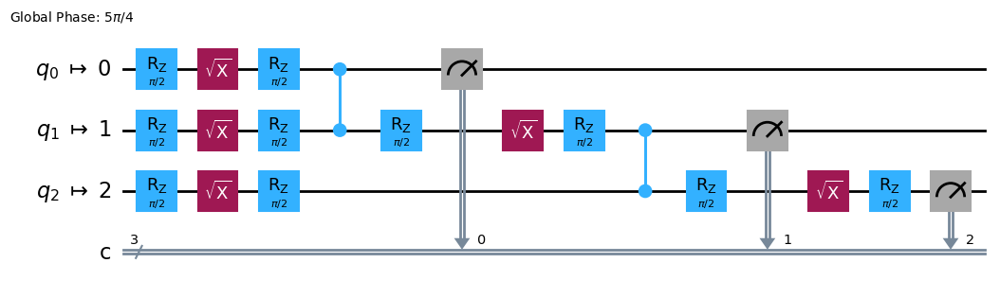

In [ ]:
# Convert to an ISA circuit and layout-mapped observables.
pm = generate_preset_pass_manager(backend=backend, optimization_level=1)
isa_circuit = pm.run(qc_ghz)

isa_circuit.draw("mpl", idle_wires=False)

In [ ]:
from qiskit import transpile
from qiskit_ibm_runtime import SamplerV2 as Sampler

qc_hw = transpile(isa_circuit, backend=backend)
sampler = Sampler(mode=backend)

job = sampler.run([(isa_circuit)])
print(f">>> Job ID: {job.job_id()}")
print(f">>> Job Status: {job.status()}")

>>> Job ID: d4urq4uaec6c738rmkr0
>>> Job Status: QUEUED


In [ ]:
result = job.result()

  Outcomes : {'111': 1540, '000': 1803, '011': 89, '100': 70, '110': 259, '001': 234, '010': 71, '101': 30}


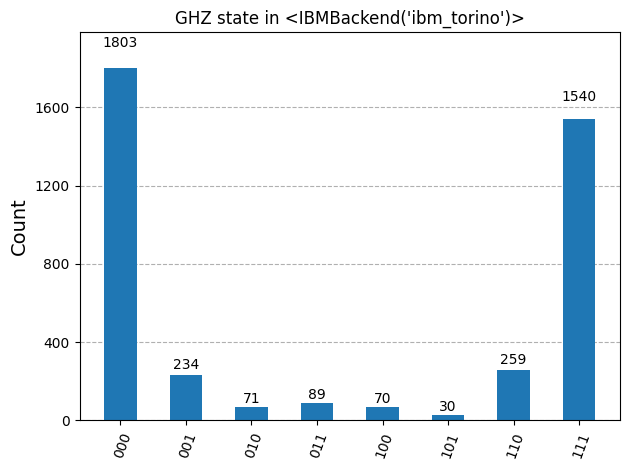

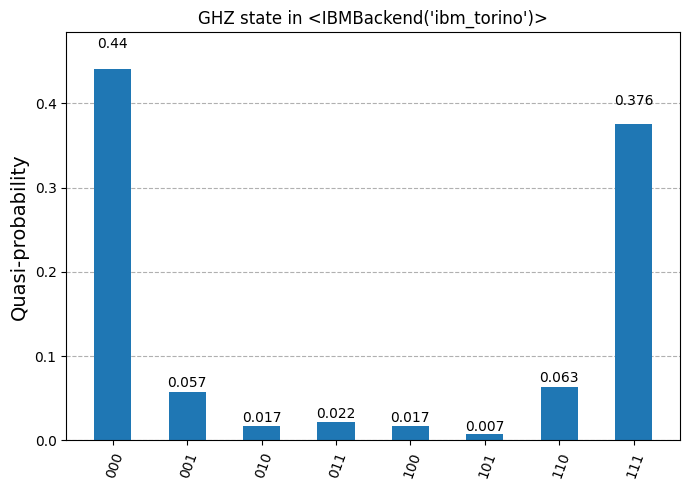

In [ ]:
counts_list = result[0].data.c.get_counts()
print(f"  Outcomes : {counts_list}")
display(plot_histogram(counts_list, title=f"GHZ state in {str(backend)}"))
display(plot_distribution(counts_list, title=f"GHZ state in {str(backend)}"))

El ordenador cuántico que se utilizó (que es el que estaba menos ocupado), es el ibm_torino. Este tiene 133 cubits, y tiene arquitectura modular: Está diseñado para ser parte de la plataforma IBM Quantum System Two, una infraestructura escalable que combina hardware cuántico (procesadores) con electrónica de control clásica y refrigeración criogénica avanzada.

Como podemos observar, en el simulador las muestras salen limpias (sin ruido), pero en un ordenador cuantico real las mismas tienen ruido. De 4096 muestras, 3343 (un 81.61%) muestras son correctas, el resto son erróneas.

In [ ]:
# Calculamos el número de estados no válidos (diferentes de 000 y 111)
counts_dict = result[0].data.c.get_counts()
num_invalid_states = 0
total_shots = 0
for key in counts_dict.keys():
    total_shots += counts_dict[key]
    if key != '000' and key != '111':
        num_invalid_states += counts_dict[key]
print(f"Número de estados no válidos: {num_invalid_states} de un total de {total_shots} muestras.")
print(f"Tasa de estados no válidos: {num_invalid_states/total_shots:.4f} ({num_invalid_states/total_shots*100:.2f}%)")


Número de estados no válidos: 753 de un total de 4096 muestras.
Tasa de estados no válidos: 0.1838 (18.38%)


b) Ejecute el circuito en un backend con el modelo de ruido de un ordenador cuántico real (fake backend) y compare con el resultado obtenido en el apartado anterior.

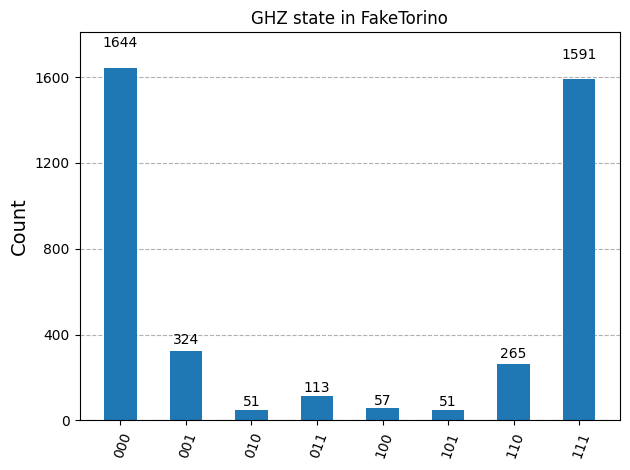

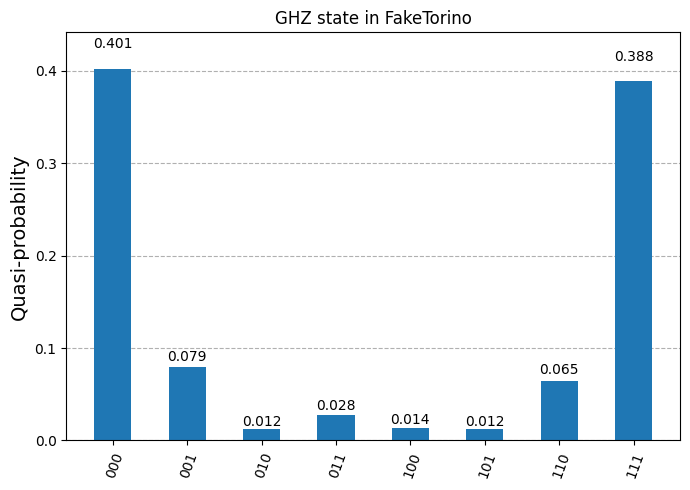

In [ ]:
from qiskit_ibm_runtime.fake_provider import FakeTorino
from qiskit.visualization import plot_distribution

backend = FakeTorino()
fake_job = backend.run(qc_ghz, shots=4096)
fake_result = fake_job.result()
fake_counts = fake_result.get_counts()
display(plot_histogram(fake_counts, title="GHZ state in FakeTorino"))
display(plot_distribution(fake_counts, title="GHZ state in FakeTorino"))

In [ ]:
# Calculamos la tasa de muestras correspondientes a estados no válidos (diferentes de 000 y 111)
def get_ghz_error_rate_from_samples(counts):
    num_invalid_states = 0
    total_shots = 0
    for key in counts.keys():
        total_shots += counts[key]
        if key != '000' and key != '111':
            num_invalid_states += counts[key]
    return num_invalid_states, total_shots

num_invalid_states, total_shots = get_ghz_error_rate_from_samples(fake_counts)

print(f"Número de estados no válidos en FakeTorino: {num_invalid_states} de un total de {total_shots} muestras.")
print(f"Tasa de estados no válidos en FakeTorino: {num_invalid_states/total_shots:.4f} ({num_invalid_states/total_shots*100:.2f}%)")

Número de estados no válidos en FakeTorino: 861 de un total de 4096 muestras.
Tasa de estados no válidos en FakeTorino: 0.2102 (21.02%)


Vemos que la tasa de estados no válidos en el ordenador cuántico real es similar a la obtenida en la simulación con ruido.


## Ejercicio 6.2

Partiendo de los resultados del ejercicio anterior, denominando $F_{error}$ a la fracción de muestras incorrectas sobre el total de muestras total, estudie el comportamiento de $F_{error}$ en los siguientes escenarios:

a) Con distintos circuitos GHZ equivalentes al empleado en el apartado anterior

In [ ]:
def simular(qc, backend, estados_correctos, shots=4096, mostrar_histograma=True):
    print("==" * 80)
    print(f"Backend         : {backend.name}")
    print(f"Nº de qubits    : {backend.num_qubits}")
    print(f"Implementación  : {qc.name}")
    print("==" * 80)

    job = backend.run(qc, shots=shots)
    results = job.result()
    counts = results.get_counts()

    if mostrar_histograma:
        display(plot_histogram(counts, title=f'GHZ state - {backend.name} - {qc.name}'))

    #total = sum(counts.values())
    total = shots
    correctos = sum(counts.get(s, 0) for s in estados_correctos)
    incorrectos = total - correctos

    porc_correctos = 100 * correctos / total
    porc_incorrectos = 100 * incorrectos / total
    f_error = incorrectos / total  # fracción

    print(f"Estados correctos    : {estados_correctos}")
    print(f"Correctos            : {correctos}")
    print(f"Porcentaje correctos : {porc_correctos:.2f}%")
    print(f"Incorrectos          : {incorrectos}")
    print(f"Porcentaje incorrectos: {porc_incorrectos:.2f}%")
    print(f"Ferror (fracción)    : {f_error:.4f}")

    ops = qc.count_ops()

    resumen = {
        "backend": backend.name,
        "implementacion": qc.name,
        "num_qubits_circuito": qc.num_qubits,
        "shots": total,
        "correctos": correctos,
        "incorrectos": incorrectos,
        "porc_correctos": porc_correctos,
        "porc_incorrectos": porc_incorrectos,
        "Ferror": f_error,
        "profundidad": qc.depth(),
        "num_puertas_totales": qc.size(),
        "num_CX": int(ops.get('cx', 0)),
        "num_H": int(ops.get('h', 0)),
    }

    return resumen

In [ ]:
def ghz_chain_from_0(n_qubits):
    """
    H en el qubit 0, y CNOTs desde 0 al resto (estrella).
    """
    qc = QuantumCircuit(n_qubits, n_qubits)
    qc.name = "GHZ_chain_from_0"

    qc.h(0)
    for i in range(1, n_qubits):
        qc.cx(0, i)

    qc.measure(range(n_qubits), range(n_qubits))
    return qc


def ghz_ladder(n_qubits):
    """
    H en el qubit 0, luego CNOT en escalera: 0→1, 1→2, 2→3, ...
    """
    qc = QuantumCircuit(n_qubits, n_qubits)
    qc.name = "GHZ_ladder"

    qc.h(0)
    for i in range(n_qubits - 1):
        qc.cx(i, i + 1)

    qc.measure(range(n_qubits), range(n_qubits))
    return qc


def ghz_central(n_qubits):
    """
    H en el qubit central (para n impar), y CNOTs en cadena desde el centro.
    Para n par, usa el qubit n//2.
    """
    qc = QuantumCircuit(n_qubits, n_qubits)
    qc.name = "GHZ_central"

    center = n_qubits // 2
    qc.h(center)

    # Propagamos hacia la derecha
    for i in range(center, n_qubits - 1):
        qc.cx(i, i + 1)

    # Propagamos hacia la izquierda
    for i in range(center, 0, -1):
        qc.cx(i, i - 1)

    qc.measure(range(n_qubits), range(n_qubits))
    return qc

Usando backend: fake_torino


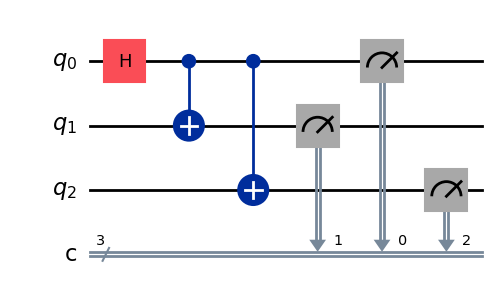

Backend         : fake_torino
Nº de qubits    : 133
Implementación  : GHZ_chain_from_0


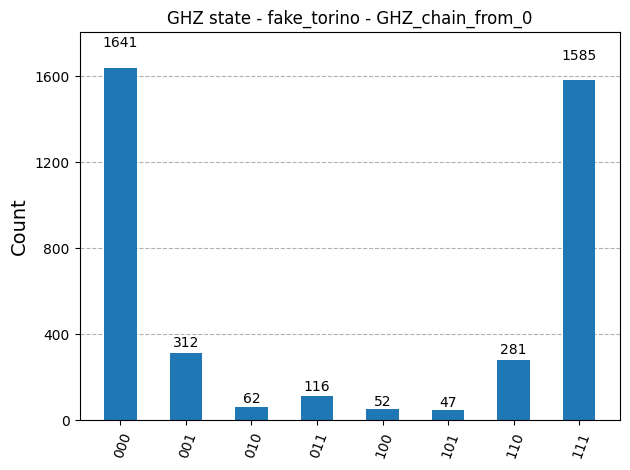

Estados correctos    : ['000', '111']
Correctos            : 3226
Porcentaje correctos : 78.76%
Incorrectos          : 870
Porcentaje incorrectos: 21.24%
Ferror (fracción)    : 0.2124
----------------------------------------------------------------------------------------------------------------------------------------------------------------
Simulacion: 
----------------------------------------------------------------------------------------------------------------------------------------------------------------


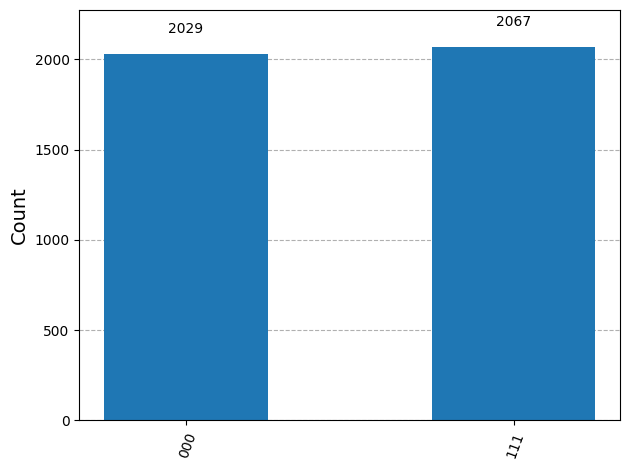

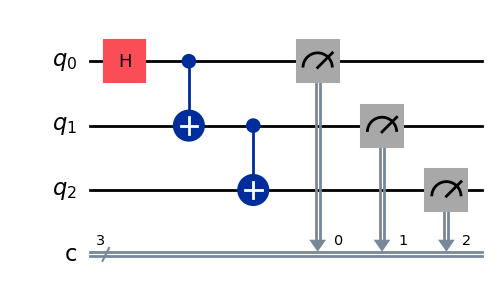

Backend         : fake_torino
Nº de qubits    : 133
Implementación  : GHZ_ladder


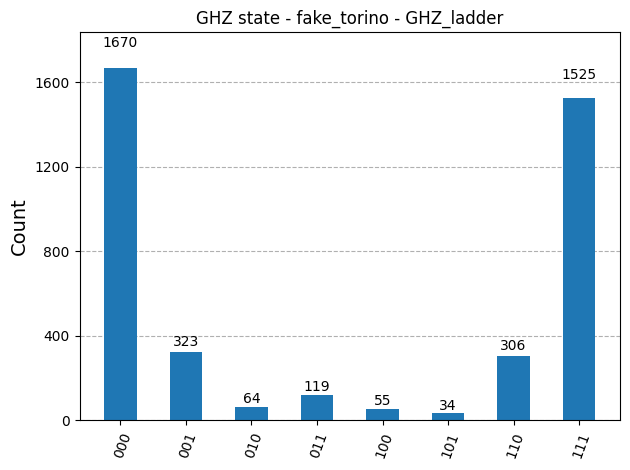

Estados correctos    : ['000', '111']
Correctos            : 3195
Porcentaje correctos : 78.00%
Incorrectos          : 901
Porcentaje incorrectos: 22.00%
Ferror (fracción)    : 0.2200
----------------------------------------------------------------------------------------------------------------------------------------------------------------
Simulacion: 
----------------------------------------------------------------------------------------------------------------------------------------------------------------


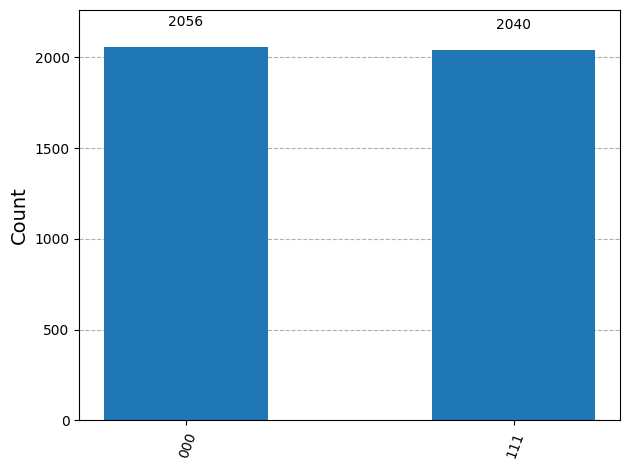

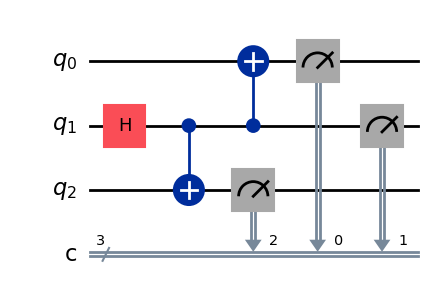

Backend         : fake_torino
Nº de qubits    : 133
Implementación  : GHZ_central


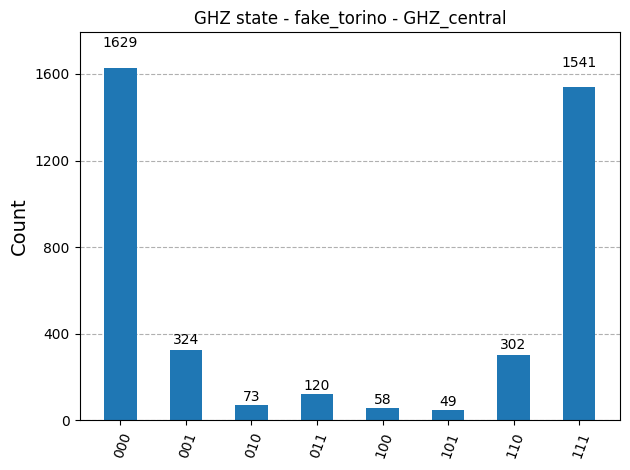

Estados correctos    : ['000', '111']
Correctos            : 3170
Porcentaje correctos : 77.39%
Incorrectos          : 926
Porcentaje incorrectos: 22.61%
Ferror (fracción)    : 0.2261
----------------------------------------------------------------------------------------------------------------------------------------------------------------
Simulacion: 
----------------------------------------------------------------------------------------------------------------------------------------------------------------


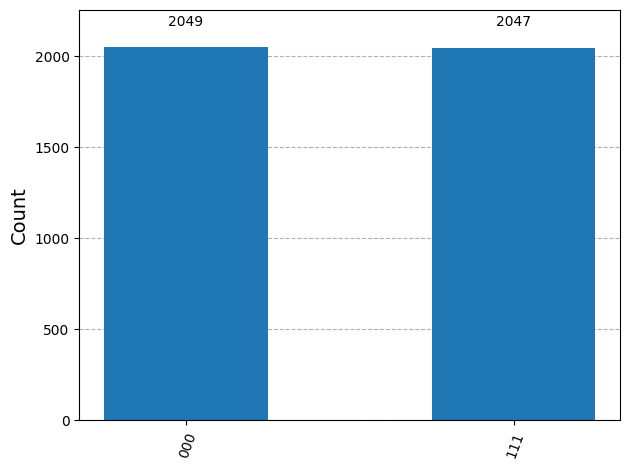



====== RESUMEN COMPARATIVO IMPLEMENTACIONES GHZ (FakeTorino) ======

    backend   implementacion  num_qubits_circuito  shots  correctos  incorrectos  porc_correctos  porc_incorrectos   Ferror  profundidad  num_puertas_totales  num_CX  num_H
fake_torino GHZ_chain_from_0                    3   4096       3226          870       78.759766         21.240234 0.212402            4                    6       2      1
fake_torino       GHZ_ladder                    3   4096       3195          901       78.002930         21.997070 0.219971            4                    6       2      1
fake_torino      GHZ_central                    3   4096       3170          926       77.392578         22.607422 0.226074            4                    6       2      1


In [ ]:
# Nº de qubits del GHZ que quieres
n_qubits_ghz = 3

# Estados correctos esperados del GHZ de n qubits: |00..0> y |11..1>
estado_0 = "0" * n_qubits_ghz
estado_1 = "1" * n_qubits_ghz
estados_correctos = [estado_0, estado_1]

# Obtenemos FakeTorino del provider
provider = FakeProviderForBackendV2()
fake_backends = provider.backends()

backend_torino = None
for b in fake_backends:
    if "torino" in b.name.lower():
        backend_torino = b
        break

if backend_torino is None:
    raise ValueError("No se encontró un backend tipo 'torino' en FakeProviderForBackendV2")

print(f"Usando backend: {backend_torino.name}")

# Lista de implementaciones de GHZ a comparar
implementaciones = [
    ghz_chain_from_0,
    ghz_ladder,
    ghz_central,
]

resultados = []

for constructor in implementaciones:
    qc = constructor(n_qubits_ghz)
    display(qc.draw("mpl"))
    resumen = simular(qc, backend_torino, estados_correctos, shots=4096, mostrar_histograma=True)
    print("--" * 80)
    print("Simulacion: ")
    print("--" * 80)
    backend = Aer.get_backend('qasm_simulator')
    circq = transpile(qc, backend)
    job = backend.run(circq, shots=4096)
    result = job.result()
    counts = result.get_counts()
    display(plot_histogram(counts))
    resultados.append(resumen)

# --- Comparación global: todos usan mismo nº de qubits; ordenamos por profundidad y/o Ferror ---

df = pd.DataFrame(resultados)

df_ordenado = df.sort_values(by=["profundidad", "Ferror"], ascending=[True, True])

print("\n\n====== RESUMEN COMPARATIVO IMPLEMENTACIONES GHZ (FakeTorino) ======\n")
print(df_ordenado.to_string(index=False))

Ahora, veamos si mejora traspilando:

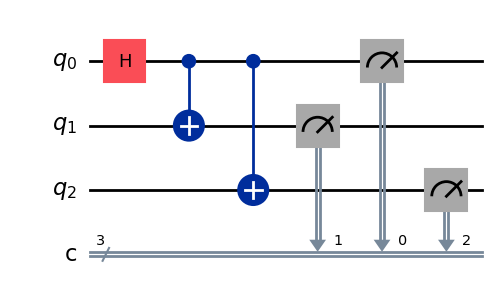

Backend         : fake_torino
Nº de qubits    : 133
Implementación  : GHZ_chain_from_0


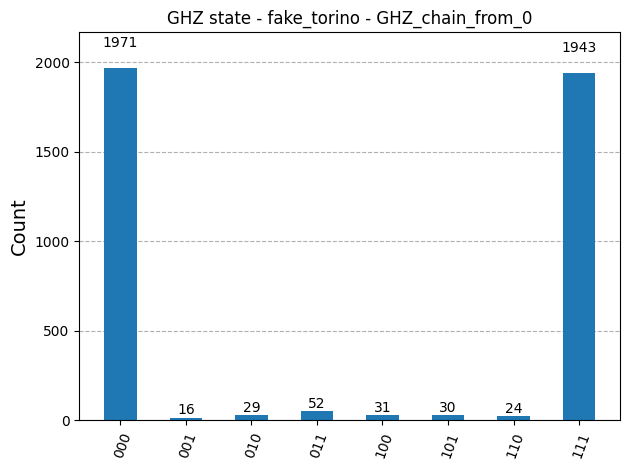

Estados correctos    : ['000', '111']
Correctos            : 3914
Porcentaje correctos : 95.56%
Incorrectos          : 182
Porcentaje incorrectos: 4.44%
Ferror (fracción)    : 0.0444
----------------------------------------------------------------------------------------------------------------------------------------------------------------
Simulacion: 
----------------------------------------------------------------------------------------------------------------------------------------------------------------


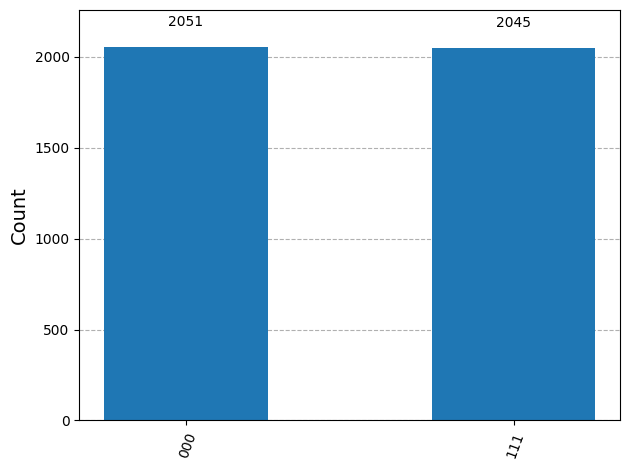

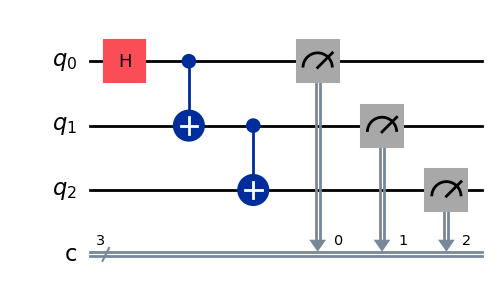

Backend         : fake_torino
Nº de qubits    : 133
Implementación  : GHZ_ladder


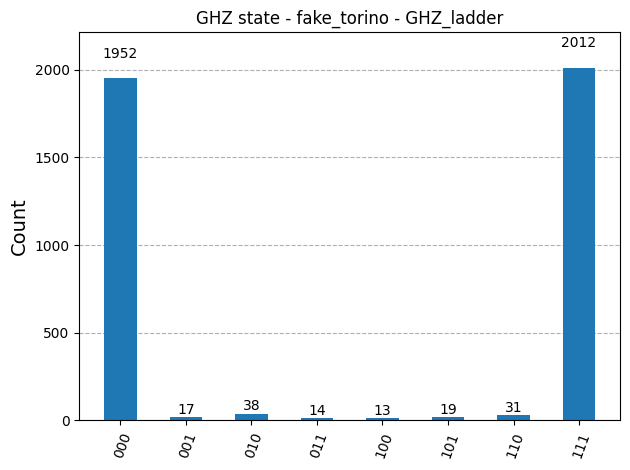

Estados correctos    : ['000', '111']
Correctos            : 3964
Porcentaje correctos : 96.78%
Incorrectos          : 132
Porcentaje incorrectos: 3.22%
Ferror (fracción)    : 0.0322
----------------------------------------------------------------------------------------------------------------------------------------------------------------
Simulacion: 
----------------------------------------------------------------------------------------------------------------------------------------------------------------


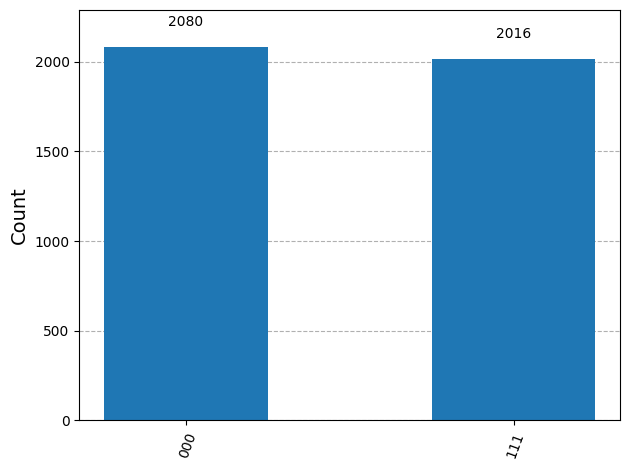

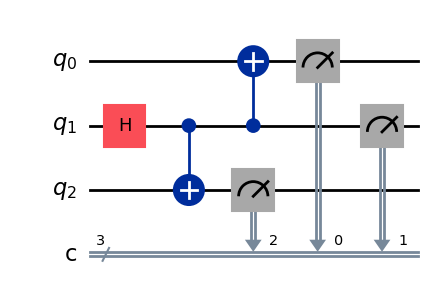

Backend         : fake_torino
Nº de qubits    : 133
Implementación  : GHZ_central


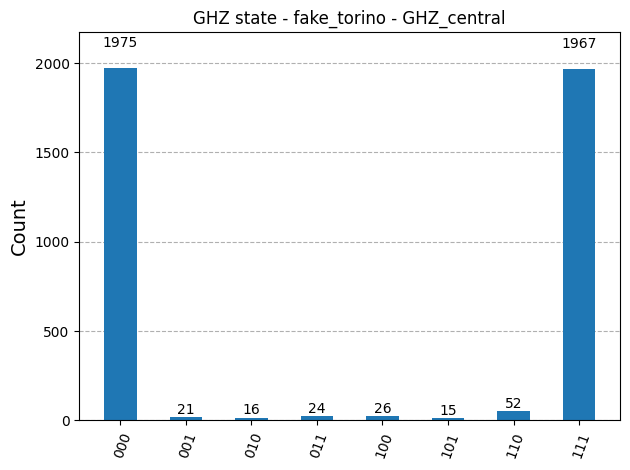

Estados correctos    : ['000', '111']
Correctos            : 3942
Porcentaje correctos : 96.24%
Incorrectos          : 154
Porcentaje incorrectos: 3.76%
Ferror (fracción)    : 0.0376
----------------------------------------------------------------------------------------------------------------------------------------------------------------
Simulacion: 
----------------------------------------------------------------------------------------------------------------------------------------------------------------


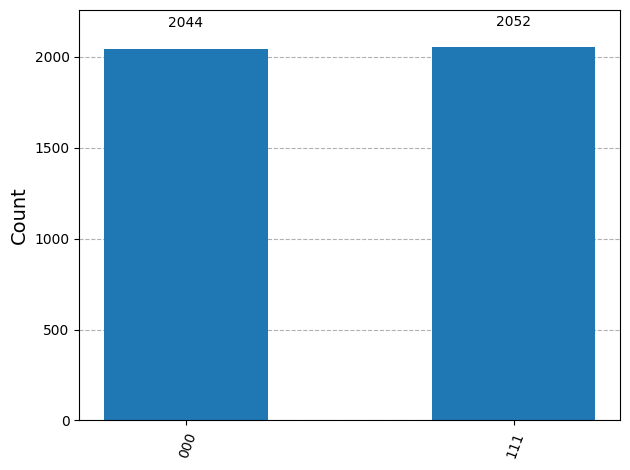



====== RESUMEN COMPARATIVO IMPLEMENTACIONES GHZ (FakeTorino) ======

    backend   implementacion  num_qubits_circuito  shots  correctos  incorrectos  porc_correctos  porc_incorrectos   Ferror  profundidad  num_puertas_totales  num_CX  num_H
fake_torino      GHZ_central                  133   4096       3942          154       96.240234          3.759766 0.037598            8                   18       0      0
fake_torino GHZ_chain_from_0                  133   4096       3914          182       95.556641          4.443359 0.044434            8                   18       0      0
fake_torino       GHZ_ladder                  133   4096       3964          132       96.777344          3.222656 0.032227           10                   18       0      0


In [ ]:
resultados = []

for constructor in implementaciones:
    qc = constructor(n_qubits_ghz)
    qc_hw = transpile(qc, backend=backend_torino)
    display(qc.draw("mpl"))
    resumen = simular(qc_hw, backend_torino, estados_correctos, shots=4096, mostrar_histograma=True)
    print("--" * 80)
    print("Simulacion: ")
    print("--" * 80)
    backend = Aer.get_backend('qasm_simulator')
    circq = transpile(qc, backend)
    job = backend.run(circq, shots=4096)
    result = job.result()
    counts = result.get_counts()
    display(plot_histogram(counts))
    resultados.append(resumen)

# --- Comparación global: todos usan mismo nº de qubits; ordenamos por profundidad y/o Ferror ---

df = pd.DataFrame(resultados)

df_ordenado = df.sort_values(by=["profundidad", "Ferror"], ascending=[True, True])

print("\n\n====== RESUMEN COMPARATIVO IMPLEMENTACIONES GHZ (FakeTorino) ======\n")
print(df_ordenado.to_string(index=False))

Se observa una reducción drástica de la tasa de error $F_{error}$ al aplicar la transpilación del circuito al backend correspondiente.

Este efecto se debe a la optimización en la asignación de qubits físicos, la reducción del número de puertas CNOT efectivas y la eliminación de rutas no compatibles con la conectividad real del procesador.

Este resultado evidencia que una implementación no adaptada al hardware introduce un sobrecoste de error que puede superar ampliamente al propio ruido intrínseco del sistema.

## Ejercicio 6.3

Una manera más detallada de analizar el efecto del ruido o los
errores de las puertas que componen un circuito, como se ha observado en los
apartados anteriores, necesita tener en cuenta los qubits que existan en la
arquitectura del ordenador aunque no formen parte del circuito. Denominando
“qubits dummy” a estos qubits que estarán inicializados a $|0\rangle$ y no deberán
cambiar su valor. Con el parámetro $F_{error}$ calculado como la fracción de muestras
incorrectas sobre el total de muestras total, estudie el comportamiento de Ferror
en los siguientes escenarios:

a) Replique el circuito GHZ tantas veces como sea necesario, para rellenar
todos los qubits de la arquitectura, y realice un estudio del
comportamiento de ruido.

b) Realice un estudio del ruido midiendo también el efecto de los qubits
dummy, para ello incluya en las medidas los estados ampliados con estos
qubits.

**Solución:**

Primero, analicemos que sucede si entrelazamos todos los qubits:

Usando backend: fake_torino  (qubits = 133)
Backend              : fake_torino
Qubits backend       : 133
Qubits usados        : 15
Tamaño de bloque GHZ : 3
Nº bloques GHZ       : 5
Nº estados correctos : 32 (2^5)


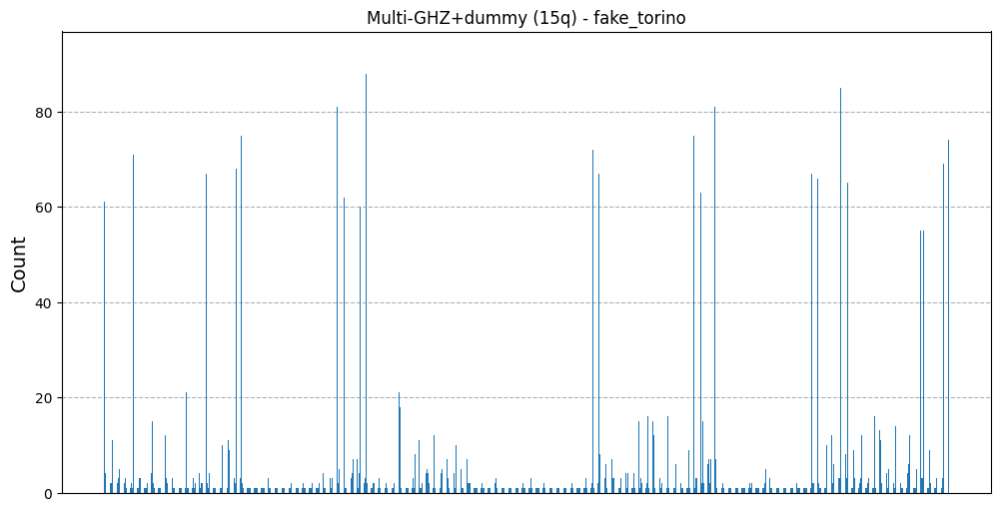

Shots totales          : 4096
Correctos globales     : 2176
Porcentaje correctos   : 53.12%
Incorrectos globales   : 1920
Porcentaje incorrectos : 46.88%
Ferror (fracción)      : 0.4688

===== RESUMEN MULTI-GHZ + DUMMY (6.3.a) =====

    backend  num_qubits_backend  num_qubits_usados  block_size  num_blocks  num_estados_correctos  shots  correctos_globales  incorrectos_globales  porc_correctos  porc_incorrectos  Ferror  profundidad  num_puertas_totales  num_CX  num_H
fake_torino                 133                 15           3           5                     32   4096                2176                  1920          53.125            46.875 0.46875           10                   90       0      0


In [ ]:
from qiskit import QuantumCircuit, transpile
from qiskit.visualization import plot_histogram
from qiskit_ibm_runtime.fake_provider import FakeProviderForBackendV2
import pandas as pd
from itertools import product

# ========================
# 1. Construir multi-GHZ + dummies
# ========================

def construir_multi_ghz_con_dummy(backend, block_size=3, max_qubits=None):
    """
    Construye un circuito sobre TODOS (o un subconjunto) de los qubits físicos del backend:
      - Divide los qubits en bloques de tamaño block_size.
      - En cada bloque completo crea un GHZ en escalera (H + CNOT...).
      - Los qubits sobrantes (si los hay) quedan como dummy en |0>.
      - Mide TODOS los qubits usados.
    Devuelve:
      - circuito transpilado para el backend
      - num_blocks (nº de bloques GHZ)
      - n_total (nº de qubits realmente usados)
    """
    n_backend = backend.num_qubits
    if max_qubits is None:
        n_total = n_backend
    else:
        n_total = min(n_backend, max_qubits)

    qc = QuantumCircuit(n_total, n_total)
    qc.name = f"multi_GHZ_block{block_size}_{n_total}q"

    # Número de bloques GHZ completos
    num_blocks = n_total // block_size

    for b in range(num_blocks):
        start = b * block_size
        end = start + block_size
        ghz_qubits = list(range(start, end))

        # GHZ en escalera dentro del bloque
        q0 = ghz_qubits[0]
        qc.h(q0)
        for i in range(len(ghz_qubits) - 1):
            qc.cx(ghz_qubits[i], ghz_qubits[i+1])

    # Qubits sobrantes (n_total % block_size) se quedan como dummy en |0>

    # Medimos TODOS los qubits usados
    qc.measure(range(n_total), range(n_total))

    # Adaptamos al backend
    qc_hw = transpile(qc, backend=backend)

    return qc_hw, num_blocks, n_total


# ========================
# 2. Estados correctos multi-GHZ + dummies
# ========================

def estados_validos_multi_ghz(total_qubits, num_blocks, block_size=3):
    """
    Genera todos los bitstrings globales correctos:
      - Cada bloque GHZ (de block_size qubits) está en todo 0 o todo 1.
      - Los qubits sobrantes (dummy) quedan en 0.
    Tiene en cuenta que Qiskit devuelve las bitstrings en orden little-endian
    (LSB = qubit 0, MSB = qubit total_qubits-1), así que se invierte al final.
    """
    valid_states = []

    for combo in product([0, 1], repeat=num_blocks):
        # bits indexados por qubit: posición i = qubit i
        bits_by_qubit = ["0"] * total_qubits

        for block_index, block_val in enumerate(combo):
            start = block_index * block_size
            end = start + block_size
            if block_val == 1:
                for q in range(start, end):
                    bits_by_qubit[q] = "1"

        # Qubits sobrantes ya están en "0"

        # Pasamos a string en el orden que devuelve Qiskit (reversed)
        bitstring = "".join(reversed(bits_by_qubit))
        valid_states.append(bitstring)

    return valid_states


# ========================
# 3. Simular y calcular Ferror global (6.3.a)
# ========================

def simular_multi_ghz_dummy(backend, block_size=3, max_qubits=None, shots=4096, mostrar_histograma=True):
    """
    6.3.a:
      - Construye un circuito con múltiples GHZ que rellenan los qubits usados.
      - Usa qubits sobrantes como dummy en |0>.
      - Calcula Ferror global: una muestra es incorrecta si
        cualquier bloque GHZ o cualquier dummy está mal.
    """
    qc_hw, num_blocks, n_total = construir_multi_ghz_con_dummy(
        backend, block_size=block_size, max_qubits=max_qubits
    )

    estados_correctos = estados_validos_multi_ghz(n_total, num_blocks, block_size=block_size)

    print("==" * 60)
    print(f"Backend              : {backend.name}")
    print(f"Qubits backend       : {backend.num_qubits}")
    print(f"Qubits usados        : {n_total}")
    print(f"Tamaño de bloque GHZ : {block_size}")
    print(f"Nº bloques GHZ       : {num_blocks}")
    print(f"Nº estados correctos : {len(estados_correctos)} (2^{num_blocks})")
    print("==" * 60)

    job = backend.run(qc_hw, shots=shots)
    results = job.result()
    counts = results.get_counts()

    if mostrar_histograma:
        # No se muestran los ticks para evitar saturar el gráfico
        # No se muestran los valores del eje x
        fig, ax = plt.subplots(figsize=(12, 6))
        plot_histogram(counts, title=f'Multi-GHZ+dummy ({n_total}q) - {backend.name}',
                       bar_labels=False, ax=ax)
        ax.set_xticks([])
        display(fig)
    plt.close(fig)

    total = sum(counts.values())
    correctos = sum(counts.get(s, 0) for s in estados_correctos)
    incorrectos = total - correctos

    porc_correctos = 100 * correctos / total
    porc_incorrectos = 100 * incorrectos / total
    f_error = incorrectos / total

    print(f"Shots totales          : {total}")
    print(f"Correctos globales     : {correctos}")
    print(f"Porcentaje correctos   : {porc_correctos:.2f}%")
    print(f"Incorrectos globales   : {incorrectos}")
    print(f"Porcentaje incorrectos : {porc_incorrectos:.2f}%")
    print(f"Ferror (fracción)      : {f_error:.4f}")

    ops = qc_hw.count_ops()

    resumen = {
        "backend": backend.name,
        "num_qubits_backend": backend.num_qubits,
        "num_qubits_usados": n_total,
        "block_size": block_size,
        "num_blocks": num_blocks,
        "num_estados_correctos": len(estados_correctos),
        "shots": total,
        "correctos_globales": correctos,
        "incorrectos_globales": incorrectos,
        "porc_correctos": porc_correctos,
        "porc_incorrectos": porc_incorrectos,
        "Ferror": f_error,
        "profundidad": qc_hw.depth(),
        "num_puertas_totales": qc_hw.size(),
        "num_CX": int(ops.get('cx', 0)),
        "num_H": int(ops.get('h', 0)),
    }

    return resumen


# ========================
# 4. Ejemplo de uso (FakeTorino o cualquier otro backend)
# ========================

provider = FakeProviderForBackendV2()
fake_backends = provider.backends()


backend = None
for b in fake_backends:
    if "torino" in b.name.lower():
        backend = b
        break

if backend is None:
    backend = fake_backends[0]  # fallback

print(f"Usando backend: {backend.name}  (qubits = {backend.num_qubits})")

resumen_multi = simular_multi_ghz_dummy(
    backend,
    block_size=3,
    max_qubits=15,
    shots=4096,
    mostrar_histograma=True
)

df = pd.DataFrame([resumen_multi])
print("\n===== RESUMEN MULTI-GHZ + DUMMY (6.3.a) =====\n")
print(df.to_string(index=False))


Ahora, analicemos qué sucede con los qubits dummys:

In [ ]:
from qiskit import QuantumCircuit, transpile
from qiskit.visualization import plot_histogram

from qiskit_ibm_runtime import Sampler, Session, QiskitRuntimeService
from qiskit_ibm_runtime.ibm_backend import IBMBackend  # para detectar backends reales


# =========================
# 1. Circuito GHZ + dummys
# =========================

def construir_ghz_con_dummy(backend, ghz_qubits=[0, 1, 2], max_qubits=None):
    """
    Crea un circuito sobre un subconjunto de los qubits físicos del backend.
    - max_qubits: nº máximo de qubits que quieres usar (para no petar simulador/tiempos).
    - En ghz_qubits (índices dentro de ese subconjunto) crea un GHZ en cadena.
    - El resto son dummy en |0>.
    - Se miden TODOS los qubits que se usan.
    """
    n_backend = backend.num_qubits
    if max_qubits is None:
        n_total = n_backend
    else:
        n_total = min(n_backend, max_qubits)

    qc = QuantumCircuit(n_total, n_total)
    qc.name = f"GHZ_con_dummy_{n_total}q"

    # GHZ en los qubits indicados (dentro del rango [0, n_total-1])
    q0 = ghz_qubits[0]
    qc.h(q0)
    for i in range(len(ghz_qubits) - 1):
        qc.cx(ghz_qubits[i], ghz_qubits[i+1])

    # Medimos TODOS los qubits (GHZ + dummy)
    qc.measure(range(n_total), range(n_total))

    # Adaptamos al backend (real o fake)
    qc_hw = transpile(qc, backend=backend)

    return qc_hw, n_total


# =========================
# 2. Estados válidos globales
# =========================

def estados_validos_con_dummy(total_qubits, ghz_qubits):
    """
    Genera las dos bitstrings correctas globales:
      - GHZ en 000... y dummy en 0
      - GHZ en 111... en ghz_qubits y dummy en 0
    Tiene en cuenta el orden de bits que devuelve Qiskit (reversed).
    """
    bits0 = ["0"] * total_qubits
    bits1 = ["0"] * total_qubits

    for q in ghz_qubits:
        # por el endianness de Qiskit (qubit 0 -> bit menos significativo)
        pos_str = total_qubits - 1 - q
        bits1[pos_str] = "1"

    estado_0 = "".join(bits0)
    estado_1 = "".join(bits1)

    return [estado_0, estado_1]


# =========================
# 3. Simulación / ejecución
# =========================

def simular_ghz_dummy(
    backend,
    ghz_qubits=[0, 1, 2],
    max_qubits=15,
    shots=4096,
    mostrar_histograma=True,
    show_x_ticks=True
):
    """
    Construye un GHZ en ghz_qubits dentro de un subconjunto de max_qubits qubits del backend.
    El resto son dummy. Calcula Ferror global.

    - Si backend es un IBMBackend real -> usa Sampler(backend=...) (sin Session, compatible con open plan).
    - Si es un fake backend / simulador -> usa backend.run() + get_counts().
    """
    qc_hw, n_total = construir_ghz_con_dummy(backend, ghz_qubits, max_qubits=max_qubits)
    estados_correctos = estados_validos_con_dummy(n_total, ghz_qubits)

    print("==" * 60)
    print(f"Backend             : {backend.name}")
    print(f"Nº qubits usados    : {n_total}  (de {backend.num_qubits} disponibles)")
    print(f"Qubits GHZ          : {ghz_qubits}")
    print(f"Estados correctos   : {estados_correctos}")
    print("==" * 60)

    # ---------- BACKEND REAL (primitives Sampler) ----------
    if isinstance(backend, IBMBackend):
        sampler = Sampler(mode=backend)
        job = sampler.run([qc_hw])
        result = job.result()
        counts = result[0].data.c.get_counts()

    # ---------- FAKE BACKEND / SIMULADOR ----------
    else:
        job = backend.run(qc_hw, shots=shots)
        result = job.result()
        counts = result.get_counts()

    # ---------- Análisis de resultados ----------
    if mostrar_histograma:
        if not show_x_ticks:
            # No se muestran los ticks para evitar saturar el gráfico
            # No se muestran los valores del eje x
            fig, ax = plt.subplots(figsize=(12, 6))
            plot_histogram(counts, title=f'GHZ+dummy ({n_total} qubits) - {backend.name}',
                           bar_labels=False, ax=ax)
            ax.set_xticks([])
            display(fig)
            plt.close(fig)
        else:
            display(plot_histogram(counts, title=f'GHZ+dummy ({n_total} qubits) - {backend.name}'))

    total = sum(counts.values())
    correctos = sum(counts.get(s, 0) for s in estados_correctos)
    incorrectos = total - correctos

    porc_correctos = 100 * correctos / total
    porc_incorrectos = 100 * incorrectos / total
    f_error = incorrectos / total

    print(f"Shots totales          : {total}")
    print(f"Correctos globales     : {correctos}")
    print(f"Porcentaje correctos   : {porc_correctos:.2f}%")
    print(f"Incorrectos globales   : {incorrectos}")
    print(f"Porcentaje incorrectos : {porc_incorrectos:.2f}%")
    print(f"Ferror (fracción)      : {f_error:.4f}")

    ops = qc_hw.count_ops()

    resumen = {
        "backend": backend.name,
        "num_qubits_usados": n_total,
        "num_qubits_backend": backend.num_qubits,
        "ghz_qubits": str(ghz_qubits),
        "shots": total,
        "correctos_globales": correctos,
        "incorrectos_globales": incorrectos,
        "porc_correctos": porc_correctos,
        "porc_incorrectos": porc_incorrectos,
        "Ferror": f_error,
        "profundidad": qc_hw.depth(),
        "num_puertas_totales": qc_hw.size(),
        "num_CX": int(ops.get('cx', 0)),
        "num_H": int(ops.get('h', 0)),
    }

    return resumen

Backend elegido: fake_torino - qubits: 133
Backend             : fake_torino
Nº qubits usados    : 12  (de 133 disponibles)
Qubits GHZ          : [0, 1, 2]
Estados correctos   : ['000000000000', '000000000111']


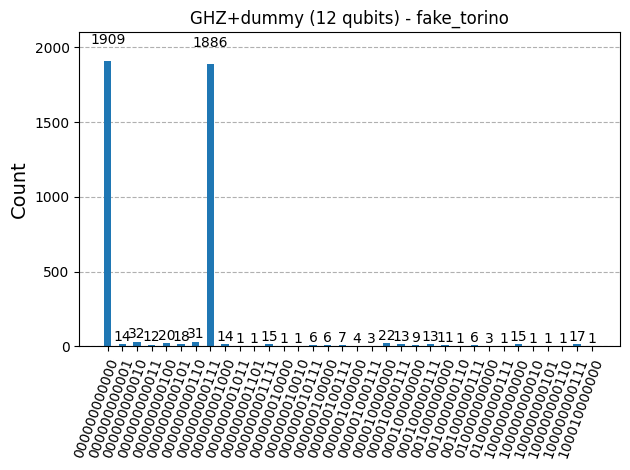

Shots totales          : 4096
Correctos globales     : 3795
Porcentaje correctos   : 92.65%
Incorrectos globales   : 301
Porcentaje incorrectos : 7.35%
Ferror (fracción)      : 0.0735
    backend  num_qubits_usados  num_qubits_backend ghz_qubits  shots  correctos_globales  incorrectos_globales  porc_correctos  porc_incorrectos   Ferror  profundidad  num_puertas_totales  num_CX  num_H
fake_torino                 12                 133  [0, 1, 2]   4096                3795                   301       92.651367          7.348633 0.073486           10                   27       0      0


In [ ]:
backend = FakeTorino()

print("Backend elegido:", backend.name, "- qubits:", backend.num_qubits)

res = simular_ghz_dummy(backend, ghz_qubits=[0,1,2], max_qubits=12, shots=4096)

df = pd.DataFrame([res])
print(df.to_string(index=False))


Y ahora, usando un backend real:

qiskit_runtime_service.backends:WARNING:2025-12-13 21:55:12,055: Loading instance: open-instance, plan: open
qiskit_runtime_service.backends:WARNING:2025-12-13 21:55:13,248: Using instance: open-instance, plan: open


Usando backend real: ibm_fez - qubits: 156
Backend             : ibm_fez
Nº qubits usados    : 100  (de 156 disponibles)
Qubits GHZ          : [0, 1, 2]
Estados correctos   : ['0000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000', '0000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111']


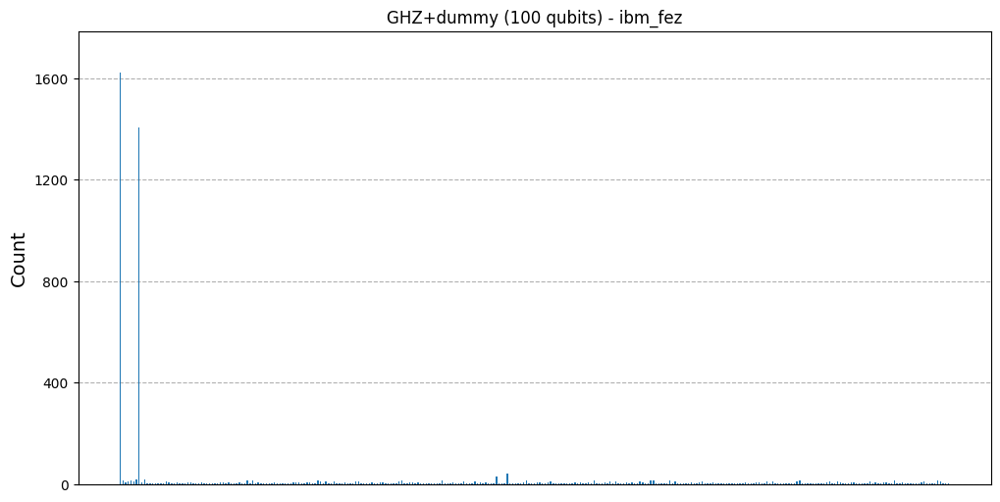

Shots totales          : 4096
Correctos globales     : 3028
Porcentaje correctos   : 73.93%
Incorrectos globales   : 1068
Porcentaje incorrectos : 26.07%
Ferror (fracción)      : 0.2607
backend  num_qubits_usados  num_qubits_backend ghz_qubits  shots  correctos_globales  incorrectos_globales  porc_correctos  porc_incorrectos   Ferror  profundidad  num_puertas_totales  num_CX  num_H
ibm_fez                100                 156  [0, 1, 2]   4096                3028                  1068       73.925781         26.074219 0.260742           10                  115       0      0


In [ ]:
backend = service.least_busy(operational=True, simulator=False)
print("Usando backend real:", backend.name, "- qubits:", backend.num_qubits)

res = simular_ghz_dummy(
    backend,
    ghz_qubits=[0, 1, 2],
    max_qubits=100,
    shots=4096,
    show_x_ticks=False
)

df = pd.DataFrame([res])
print(df.to_string(index=False))

Vemos que el porcentaje de errores aumenta considerablemente al incluir los qubits dummys en la medición. Esto se debe a que los qubits dummys, aunque no forman parte del circuito, están sujetos al ruido del sistema y pueden sufrir errores durante la ejecución del circuito. Al medir estos qubits, cualquier error que ocurra en ellos contribuye al total de muestras incorrectas, aumentando así el valor de $F_{error}$.


## Ejercicio 6.4

Explique los parámetros más representativos que definen el correcto funcionamiento de un ordenador cuántico de IBM, para ello acceda a la información disponible en:

- https://quantum.cloud.ibm.com/docs/es/guides/qpu-information#qpu-detalles
- https://quantum.cloud.ibm.com/docs/es/guides/qpu-information#datos-de-calibraci%C3%B3n

y obtenga las puertas nativas de cada una de las arquitecturas a las que tenga acceso.


**Solución:**

Los ordenadores cuánticos de $\textbf{IBM Quantum}$ se caracterizan mediante un conjunto de parámetros físicos y métricas de desempeño que determinan la calidad real del hardware. Estos parámetros se publican en la ficha técnica de cada QPU (Quantum Processing Unit) y se actualizan periódicamente mediante procesos de calibración automática.

Los principales parámetros representativos son los siguientes:

**1. Número de qubits físicos**

Indica el número total de qubits disponibles en el procesador cuántico. Este valor determina el tamaño máximo de los circuitos que pueden ejecutarse sin recurrir a técnicas de multiplexado o reutilización dinámica de qubits.

**2. Tiempo de relajación $T_1$**

El tiempo $T_1$ mide el tiempo característico en el que un qubit decae del estado excitado $|1\rangle$ al estado base $|0\rangle$. Un valor elevado de $T_1$ indica que el qubit conserva su energía durante más tiempo, reduciendo los errores por relajación.

**3. Tiempo de coherencia $T_2$**

El tiempo $T_2$ cuantifica la pérdida de coherencia de fase entre $|0\rangle$ y $|1\rangle$. Este parámetro es crítico para mantener estados de superposición y entrelazamiento. En general se cumple que $T_2 \leq 2T_1$.
**4. Error de puertas de un solo qubit (1Q error)**

Es la probabilidad media de que una operación de un solo qubit (como $X$, $H$, $R_z$, $SX$) se ejecute de forma incorrecta. En las QPU actuales de IBM estos errores suelen estar en el rango $10^{-4} - 10^{-3}$.

**5. Error de puertas de dos qubits (2Q error)**

Es el parámetro más limitante del hardware actual. Representa la probabilidad de error de las puertas CNOT (CX) o ECR.

Se mide tanto el __mejor error de dos qubits__ como el __error medio de dos qubits en capas (layered 2Q error)__, que representa una situación realista de ejecución con múltiples puertas simultáneas.

**6. Error de lectura (Readout error)**

Indica la probabilidad de que el resultado de la medida de un qubit sea incorrecto. Este error afecta directamente a la interpretación de los resultados, incluso cuando el estado cuántico interno es correcto.

**7. Frecuencia de los qubits**

Cada qubit opera a una frecuencia específica del orden de los GHz. Estas frecuencias se ajustan para minimizar interferencias entre qubits (crosstalk) y maximizar la fidelidad de control.

**8. Conectividad del procesador (Coupling map)**

La conectividad define qué pares de qubits pueden interactuar directamente mediante puertas de dos qubits. Cuando dos qubits no están conectados físicamente, el compilador cuántico introduce puertas SWAP adicionales, aumentando la profundidad del circuito y la probabilidad de error.

**9. Profundidad del circuito**

La profundidad efectiva del circuito, tras la transpilación al conjunto de puertas nativas del hardware, es clave para la fidelidad final de la ejecución. A mayor profundidad, mayor acumulación de errores por decoherencia y por imperfección de las puertas.

**10. Métrica de rendimiento CLOPS**

La métrica CLOPS (__Circuit Layer Operations Per Second__) cuantifica la capacidad de la QPU para ejecutar capas de puertas por unidad de tiempo, proporcionando una medida directa de rendimiento computacional.

------------------

**Puertas nativas en arquitecturas de IBM**

Las arquitecturas superconductoras de IBM implementan como puertas nativas principales:
$$
R_x(\theta),\quad R_z(\theta),\quad X,\quad SX,\quad H,\quad CX,\quad ECR
$$
Todas las puertas lógicas más complejas se descomponen en combinaciones de estas puertas durante la transpilación.

------------------

**Conclusión**

Los parámetros de calibración $T_1$, $T_2$, errores de puertas de uno y dos qubits, error de lectura y conectividad, determinan de forma directa la fidelidad real de los circuitos cuánticos.

Los resultados observados en los ejercicios 6.1, 6.2 y 6.3 se explican por la acumulación de estos errores, especialmente al aumentar el número de qubits, la profundidad del circuito y el uso intensivo de puertas CNOT. La transpilación optimizada permite mitigar parcialmente estos efectos reduciendo el número de operaciones reales sobre el hardware.
